In [1]:
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

In [2]:
data = pd.read_excel("./data/compactiv.xlsx")

In [3]:
data.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


# Problem 1

## Question 1 : Define the problem and perform exploratory Data Analysis
### Problem Definition :
We are given data from a workstation that is operating in a multi-user university department, the data has activity measures of the computers systems, Users use the workstation for tasks like internet access, file editing and CPU-intensive Programs, using the data set given with the system measures, we need to find a linear equation which can best predict the "Proportion of time that the CPU runs in user mode, given the input parameters that are made up of the activites listed in the data.

To do this we will apply linear regression models to the data set to find the best fit line which gives us the linear equation of the independant attribes to the dependant attribute which in this case is "usr".

Definition of the Data given is as follows:

| Attribute | Description |
|-----------|-------------|
| lread | Reads (transfers per second ) between system memory and user memory |
| lwrite | writes (transfers per second) between system memory and user memory |
| scall | Number of system calls of all types per second |
| sread | Number of system read calls per second . |
| swrite | Number of system write calls per second . |
| fork | Number of system fork calls per second. |
| exec | Number of system exec calls per second. |
| rchar | Number of characters transferred per second by system read calls |
| wchar | Number of characters transfreed per second by system write calls |
| pgout | Number of page out requests per second |
| ppgout | Number of pages, paged out per second |
| pgfree | Number of pages per second placed on the free list. |
| pgscan | Number of pages checked if they can be freed per second |
| atch | Number of page attaches (satisfying a page fault by reclaiming a page in memory) per second |
| pgin | Number of page-in requests per second |
| ppgin | Number of pages paged in per second |
| pflt | Number of page faults caused by protection errors (copy-on-writes). |
| vflt | Number of page faults caused by address translation . |
| runqsz | Process run queue size (The number of kernel threads in memory that are waiting for a CPU to run.Typically, this value should be less than 2. Consistently higher values mean that the system might be CPU-bound.) |
| freemem | Number of memory pages available to user processes |
| freeswap | Number of disk blocks available for page swapping. |
| usr | Portion of time (%) that cpus run in user mode |

### Check Shape, Data Types, Statistical Summary :
- The Data has 8192 observations and 21 independant features/attributes and 1 dependant attribute
- The Data has 13 number of features with data type : float64.
- The Data has 8 number of features with data type : int64.
- The Data has 1 number of features with data type : object.
- "runqsz" is of data type "object", we need to check this for values counts and convert to int or float.
- "Null" values are seen in "rchar" and "wchar", we need to check this and treat accordingly
- Statistical Summary:
| Attribute | Statistics | Observations |
| --- | --- | --- |
| lread | count: 8192 , mean: 19.56, stdev: 53.354,min: 0, 25th_Per: 2.0, 50th_Per: 7.0, 75th_Per: 20.0, max: 1845 | no missing values-potiential outliers-high variance|
| lwrite | count: 8192 , mean: 13.106, stdev: 29.892,min: 0, 25th_Per: 0.0, 50th_Per: 1.0, 75th_Per: 10.0, max: 575 | no missing values-potiential outliers-high variance-25th Percentile have 0 value.|
| scall | count: 8192 , mean: 2306.318, stdev: 1633.617,min: 109, 25th_Per: 1012.0, 50th_Per: 2051.5, 75th_Per: 3317.25, max: 12493 | no missing values-potiential outliers-high variance.|
| sread | count: 8192 , mean: 210.48, stdev: 198.98,min: 6, 25th_Per: 86.0, 50th_Per: 166.0, 75th_Per: 279.0, max: 5318 |  no missing values-potiential outliers-high variance.|
| swrite | count: 8192 , mean: 150.058, stdev: 160.479,min: 7, 25th_Per: 63.0, 50th_Per: 117.0, 75th_Per: 185.0, max: 5456 | no missing values-potiential outliers-high variance.|
| fork | count: 8192 , mean: 1.885, stdev: 2.479,min: 0.0, 25th_Per: 0.4, 50th_Per: 0.8, 75th_Per: 2.2, max: 20.12 | no missing values-potiential outliers-high variance.|
| exec | count: 8192 , mean: 2.792, stdev: 5.212,min: 0.0, 25th_Per: 0.2, 50th_Per: 1.2, 75th_Per: 2.8, max: 59.56 | no missing values-potiential outliers-high variance.|
| rchar | count: 8088 , mean: 197385.728, stdev: 239837.494,min: 278.0, 25th_Per: 34091.5, 50th_Per: 125473.5, 75th_Per: 267828.75, max: 2526649.0 | missing values-potiential outliers-high variance.|
| wchar | count: 8177 , mean: 95902.993, stdev: 140841.708,min: 1498.0, 25th_Per: 22916.0, 50th_Per: 46619.0, 75th_Per: 106101.0, max: 1801623.0 | missing values-potiential outliers-low variance.|
| pgout | count: 8192 , mean: 2.285, stdev: 5.307,min: 0.0, 25th_Per: 0.0, 50th_Per: 0.0, 75th_Per: 2.4, max: 81.44 | no missing values-potiential outliers-high variance-50 percent records with zero|
| ppgout | count: 8192 , mean: 5.977, stdev: 15.215,min: 0.0, 25th_Per: 0.0, 50th_Per: 0.0, 75th_Per: 4.2, max: 184.2 | no missing values-potiential outliers-high variance-50 percent records with zero|
| pgfree | count: 8192 , mean: 11.92, stdev: 32.364,min: 0.0, 25th_Per: 0.0, 50th_Per: 0.0, 75th_Per: 5.0, max: 523.0 | no missing values-potiential outliers-high variance-50 percent records with zero|
| pgscan | count: 8192 , mean: 21.527, stdev: 71.141,min: 0.0, 25th_Per: 0.0, 50th_Per: 0.0, 75th_Per: 0.0, max: 1237.0 | no missing values-potiential outliers-high variance-75 percent records with zero|
| atch | count: 8192 , mean: 1.128, stdev: 5.708,min: 0.0, 25th_Per: 0.0, 50th_Per: 0.0, 75th_Per: 0.6, max: 211.58 | no missing values-potiential outliers-high variance-50 percent records with zero|
| pgin | count: 8192 , mean: 8.278, stdev: 13.875,min: 0.0, 25th_Per: 0.6, 50th_Per: 2.8, 75th_Per: 9.765, max: 141.2 |no missing values-potiential outliers-high variance|
| ppgin | count: 8192 , mean: 12.389, stdev: 22.281,min: 0.0, 25th_Per: 0.6, 50th_Per: 3.8, 75th_Per: 13.8, max: 292.61 |no missing values-potiential outliers-high variance|
| pflt | count: 8192 , mean: 109.794, stdev: 114.419,min: 0.0, 25th_Per: 25.0, 50th_Per: 63.8, 75th_Per: 159.6, max: 899.8 |no missing values-potiential outliers-high variance|
| vflt | count: 8192 , mean: 185.316, stdev: 191.001,min: 0.2, 25th_Per: 45.4, 50th_Per: 120.4, 75th_Per: 251.8, max: 1365.0 |no missing values-potiential outliers-high variance|
| freemem | count: 8192 , mean: 1763.456, stdev: 2482.105,min: 55, 25th_Per: 231.0, 50th_Per: 579.0, 75th_Per: 2002.25, max: 12027 |no missing values-potiential outliers-high variance|
| freeswap | count: 8192 , mean: 1328125.96, stdev: 422019.427,min: 2, 25th_Per: 1042623.5, 50th_Per: 1289289.5, 75th_Per: 1730379.5, max: 2243187 |no missing values-low variance|
| usr | count: 8192 , mean: 83.969, stdev: 18.402,min: 0, 25th_Per: 81.0, 50th_Per: 89.0, 75th_Per: 94.0, max: 99 |no missing values-low variance|

In [4]:
data.shape
print(f'The Data has {data.shape[0]} observations and {data.shape[1]-1} independant features/attributes and 1 dependant attribute')

The Data has 8192 observations and 21 independant features/attributes and 1 dependant attribute


In [5]:
data.info()
for idx, val in enumerate(data.dtypes.value_counts()):
    print(f'The Data has {val} number of features with data type : {data.dtypes.value_counts().index[idx]}.')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

In [6]:
data.describe().T.round(3)

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,19.560,53.354,0.0,2.0,7.0,20.000,1845.00
lwrite,8192.0,13.106,29.892,0.0,0.0,1.0,10.000,575.00
scall,8192.0,2306.318,1633.617,109.0,1012.0,2051.5,3317.250,12493.00
sread,8192.0,210.480,198.980,6.0,86.0,166.0,279.000,5318.00
swrite,8192.0,150.058,160.479,7.0,63.0,117.0,185.000,5456.00
fork,8192.0,1.885,2.479,0.0,0.4,0.8,2.200,20.12
exec,8192.0,2.792,5.212,0.0,0.2,1.2,2.800,59.56
rchar,8088.0,197385.728,239837.494,278.0,34091.5,125473.5,267828.750,2526649.00
wchar,8177.0,95902.993,140841.708,1498.0,22916.0,46619.0,106101.000,1801623.00
pgout,8192.0,2.285,5.307,0.0,0.0,0.0,2.400,81.44


In [7]:
print('| Attribute | Statistics |')
print('| --- | --- |')
for col in data.columns[data.dtypes != 'object']:
    print(f'| {data[col].name} | count: {data[col].count()} , mean: {data[col].mean().round(3)}, stdev: {round(data[col].std(),3)},min: {round(data[col].min(),3)}, 25th_Per: {data[col].quantile(.25).round(3)}, 50th_Per: {data[col].quantile(.50).round(3)}, 75th_Per: {data[col].quantile(.75).round(3)}, max: {round(data[col].max(),3)} |')

| Attribute | Statistics |
| --- | --- |
| lread | count: 8192 , mean: 19.56, stdev: 53.354,min: 0, 25th_Per: 2.0, 50th_Per: 7.0, 75th_Per: 20.0, max: 1845 |
| lwrite | count: 8192 , mean: 13.106, stdev: 29.892,min: 0, 25th_Per: 0.0, 50th_Per: 1.0, 75th_Per: 10.0, max: 575 |
| scall | count: 8192 , mean: 2306.318, stdev: 1633.617,min: 109, 25th_Per: 1012.0, 50th_Per: 2051.5, 75th_Per: 3317.25, max: 12493 |
| sread | count: 8192 , mean: 210.48, stdev: 198.98,min: 6, 25th_Per: 86.0, 50th_Per: 166.0, 75th_Per: 279.0, max: 5318 |
| swrite | count: 8192 , mean: 150.058, stdev: 160.479,min: 7, 25th_Per: 63.0, 50th_Per: 117.0, 75th_Per: 185.0, max: 5456 |
| fork | count: 8192 , mean: 1.885, stdev: 2.479,min: 0.0, 25th_Per: 0.4, 50th_Per: 0.8, 75th_Per: 2.2, max: 20.12 |
| exec | count: 8192 , mean: 2.792, stdev: 5.212,min: 0.0, 25th_Per: 0.2, 50th_Per: 1.2, 75th_Per: 2.8, max: 59.56 |
| rchar | count: 8088 , mean: 197385.728, stdev: 239837.494,min: 278.0, 25th_Per: 34091.5, 50th_Per: 125473.5

### Univariate analysis:
- plotting boxplots
    - The features are on different scales, but the scale for rchar,wchar and freeswap is very different, plot these seperate than the others.
    - Also the features scall,sread,swrite, pgfree, pgscan, pflt, vflt and freemem are on a medium scale, plot these seperate.
    - all the features have outliers
    - all the feature are skewed
- plotting kde plots
    - plotting the data collectively but due to the different scales its hard to compare
- plotting the data seperately
    - boxplots
        - lread outliers are present, skewed to the right, High Variance.
        - lwrite outliers are presen, skewed to the right, High Variance.
        - scall outliers are present, skewed to the right, High Variance.
        - sread outliers are present, skewed to the right, High Variance.
        - swrite outliers are present, skewed to the right, High Variance.
        - fork outliers are present, skewed to the right, High Variance.
        - exec outliers are present, skewed to the right, High Variance.
        - rchar outliers are present, skewed to the right, High Variance.
        - wchar outliers are present, skewed to the right, High Variance.
        - pgout outliers are present, skewed to the right, High Variance.
        - ppgout outliers are present, skewed to the right, High Variance.
        - pgfree outliers are present, skewed to the right, High Variance.
        - pgscan outliers are present, skewed to the right, High Variance.
        - atch outliers are present, skewed to the right, High Variance.
        - pgin outliers are present, skewed to the right, High Variance.
        - ppgin outliers are present, skewed to the right, High Variance.
        - pflt outliers are present, skewed to the right, High Variance.
        - vflt outliers are present, skewed to the right, High Variance.
        - freemem outliers are present, skewed to the right, High Variance.
        - freeswap outliers are present, skewed to the left, High Variance.
        - usr outliers are present, skewed to the left, High Variance.
  - kdeplots
      - lread follows bellcure, alot of small values, small IQR, long right tail, confrims the above observations from box plots.
      - lwrite follows bellcure, alot of small values, small IQR, long right tail, confrims the above observations from box plots.
      - scall follows bellcure- two peaks seen, most values between 0 and 7500, spread IQR, long right tail, confrims the above observations from box plots.
      - sread follows bellcure, alot of small values, small IQR, long right tail, confrims the above observations from box plots.
      - swrite follows bellcure, alot of small values, small IQR, long right tail, confrims the above observations from box plots.
      - fork follows bellcure, most values between 0 and 10, spread IQR, long right tail, confrims the above observations from box plots.
      - exec follows bellcure-small bumps around values 20 and 35, alot of small values, small IQR, long right tail, confrims the above observations from box plots.
      - rchar follows bellcure, most values between 0.0 and 1.0, spread IQR, long right tail, confrims the above observations from box plots.
      - wchar follows bellcure, most values between 0.0 and 0.5, spread IQR, long right tail, confrims the above observations from box plots.
      - pgout follows bellcure, alot of small values, small IQR, long right tail, confrims the above observations from box plots.
      - ppgout follows bellcure, alot of small values, small IQR, long right tail, confrims the above observations from box plots.
      - pgfree follows bellcure, alot of small values, small IQR, long right tail, confrims the above observations from box plots.
      - pgscan follows bellcure, alot of small values, small IQR, long right tail, confrims the above observations from box plots.
      - atch follows bellcure, alot of small values, small IQR, long right tail, confrims the above observations from box plots.
      - pgin follows bellcure, most values between 0 and 50, spread IQR, long right tail, confrims the above observations from box plots.
      - ppgin follows bellcure, most values between 0 and 50, spread IQR, long right tail, confrims the above observations from box plots.
      - pflt follows bellcure, most values between 0 and 400, spread IQR, long right tail, confrims the above observations from box plots.
      - vflt follows bellcure, most values between 0 and 750, spread IQR, long right tail, confrims the above observations from box plots.
      - freemem follows bellcure-small bump around 7500, most values between 0 and 7500, spread IQR, long right tail, confrims the above observations from box plots.
      - free swap follows bellcure-bumps/peaks around [0.0,1.0,2.0] , most values between 1.0 and 2,0, spread IQR, long left tail, confrims the above observations from box plots.
      - usr follows bellcure-bumps/peaks around [0,100] , most values between 60 and 100, spread IQR, long left tail, confrims the above observations from box plots.
  - distribution of runqsz:
    - The propotion for obs for "Not-CPU-Bound" to "CPU-Bound" is ~53% to 47%.
### Multivariate analysis:
- boxplots split on runqsz
    - There are difference seen in the distribution between for "Not-CPU-Bound" vs "CPU-Bound" in the following features
        - scall, sread, fork, exec, rchar, wchar, pgin, ppgin, pflt, vflt, freemem, freeswap and usr
- kdeplots split on runqz
    - There are significant difference seen in the distribution between for "Not-CPU-Bound" vs "CPU-Bound" in the following features
        - scall, rchar, freemem, freeswap, usr
- pairplots
    - Reviewing the pair plot we see there are potiential correlations between
        -  lread and lwrite
        -  scall and sread and swrite
        -  swrite and rchar and wchar
        -  fork and exec and pflt and vflt
        -  exec and pflt and vflt
        -  rchar and wchar and atch
        -  pgout and ppgout and pgfree
        -  pgfree and pgscan
        -  pgin and ppgin
        -  usr and fork and plt and vflt
- heatmap
    - Reviewing the heatmap plot we see there strong correlations between
        - lread and lwrite
        - scall and sread and swrite and fork and pflt and vflt
        - sread and swrite and rchar and pflt and vflt
        - fork and scall and exec and pflt and vflt
        - exec and fork pflt and vflt
        - rchar and sread and wchar
        - wchar and rchar
        - pgout and ppgout and pgfree and pgscan
        - ppgout and pgout and pgfree and pgscan and pgin and ppgin
        - pgfree and pgout and ppgout and pgscan and pgin and ppgin
        - pgscan and pgout and ppgout and pgfree and pgin and ppgin
        - pgin and ppgout and pgfree and pgscan and ppgin
        - ppgin and ppgout and pgfree and pgscan and pgin
        - pflt and scall and sread and fork and exec and vflt
        - vflt and scall and sread and fork and exec and pflt
        - freemem and freeswap
        - freeswap and freemem and usr
        - usr and freeswap

### Key Observations:
- There are Null values that need to be treated
- The Scaling of the Data is not consistant and we would need to do scaling.
- The all of the numeric features have a bellcure distribution with outliers.
- skewness is present in all the numerical freatures, we should try and reduce the skewness.
- There are few that have multipeaks, this is due to distribution difference due to "Not-CPU-Bound" to "CPU-Bound" states in the "runqsz", we need to take runqsz when running the model.
- There is high correlation in the dataset or .5 and above between multiple features, we would like to use tools like PCA to take care of this correlations issues
- 

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns
data_numeric =  data[data.columns[data.dtypes != 'object']]

In [9]:
data_numeric.shape

(8192, 21)

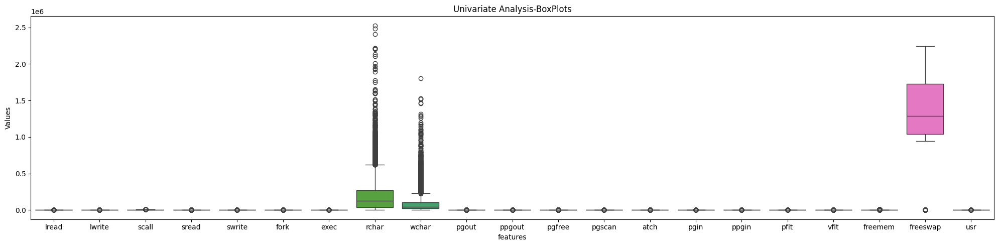

In [10]:
plt.figure(figsize=(20,5))
sns.boxplot(data_numeric)
plt.title('Univariate Analysis-BoxPlots')
plt.xlabel('features')
plt.ylabel('Values')
plt.tight_layout()
plt.savefig('./images/boxplots_all.svg')
plt.show()

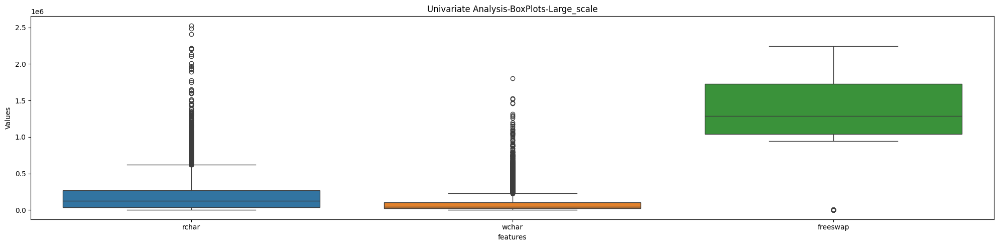

In [11]:
data_large_scale = data_numeric[['rchar','wchar','freeswap']]
plt.figure(figsize=(20,5))
sns.boxplot(data_large_scale)
plt.title('Univariate Analysis-BoxPlots-Large_scale')
plt.xlabel('features')
plt.ylabel('Values')
plt.tight_layout()
plt.savefig('./images/boxplots_large_Scale.svg')
plt.show()

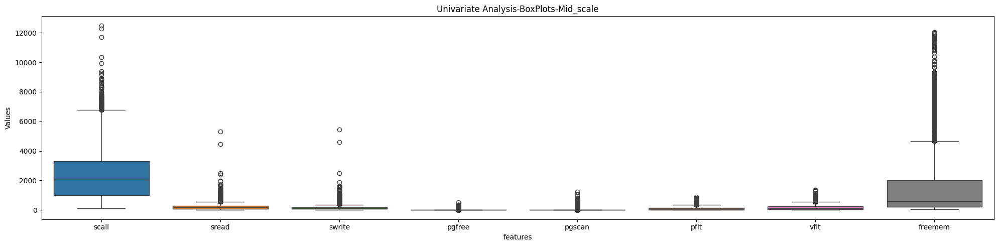

In [12]:
data_med_scale = data_numeric[['scall','sread','swrite','pgfree', 'pgscan', 'pflt', 'vflt', 'freemem']]
plt.figure(figsize=(20,5))
sns.boxplot(data_med_scale)
plt.title('Univariate Analysis-BoxPlots-Mid_scale')
plt.xlabel('features')
plt.ylabel('Values')
plt.tight_layout()
plt.savefig('./images/boxplots_Med_Scale.svg')
plt.show()

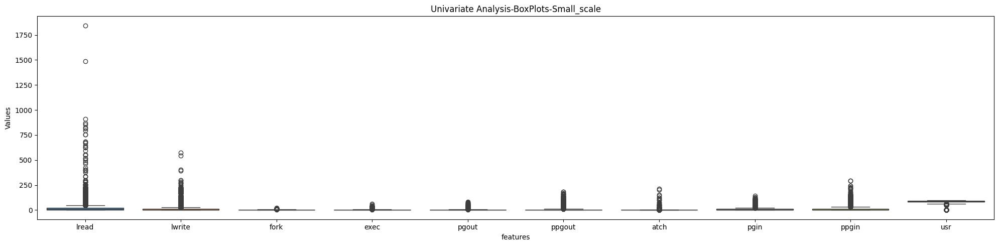

In [13]:
data_small_scale = data_numeric.drop(['rchar','wchar','freeswap','scall','sread','swrite','pgfree', 'pgscan', 'pflt', 'vflt', 'freemem'],axis=1)
plt.figure(figsize=(20,5))
sns.boxplot(data_small_scale)
plt.title('Univariate Analysis-BoxPlots-Small_scale')
plt.xlabel('features')
plt.ylabel('Values')
plt.tight_layout()
plt.savefig('./images/boxplots_small_Scale.svg')
plt.show()

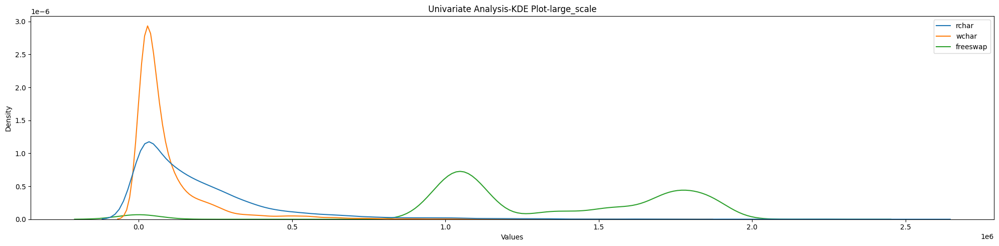

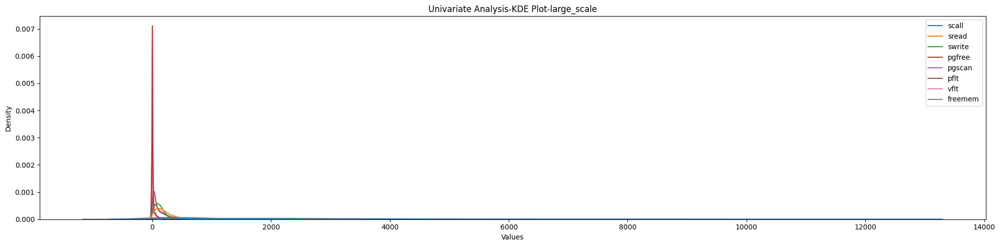

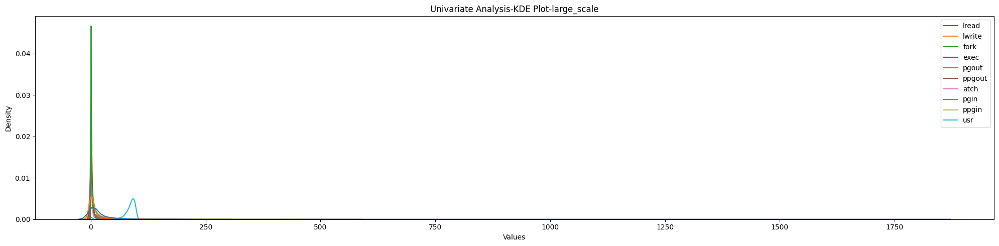

In [14]:
plt.figure(figsize=(20,5))
sns.kdeplot(data_large_scale)
plt.title('Univariate Analysis-KDE Plot-large_scale')
plt.xlabel('Values')
plt.ylabel('Density')
plt.tight_layout()
plt.savefig('./images/boxplots_Large_Scale.svg')
plt.show()

plt.figure(figsize=(20,5))
sns.kdeplot(data_med_scale)
plt.title('Univariate Analysis-KDE Plot-large_scale')
plt.xlabel('Values')
plt.ylabel('Density')
plt.tight_layout()
plt.savefig('./images/boxplots_Large_Scale.svg')
plt.show()

plt.figure(figsize=(20,5))
sns.kdeplot(data_small_scale)
plt.title('Univariate Analysis-KDE Plot-large_scale')
plt.xlabel('Values')
plt.ylabel('Density')
plt.tight_layout()
plt.savefig('./images/boxplots_Large_Scale.svg')
plt.show()

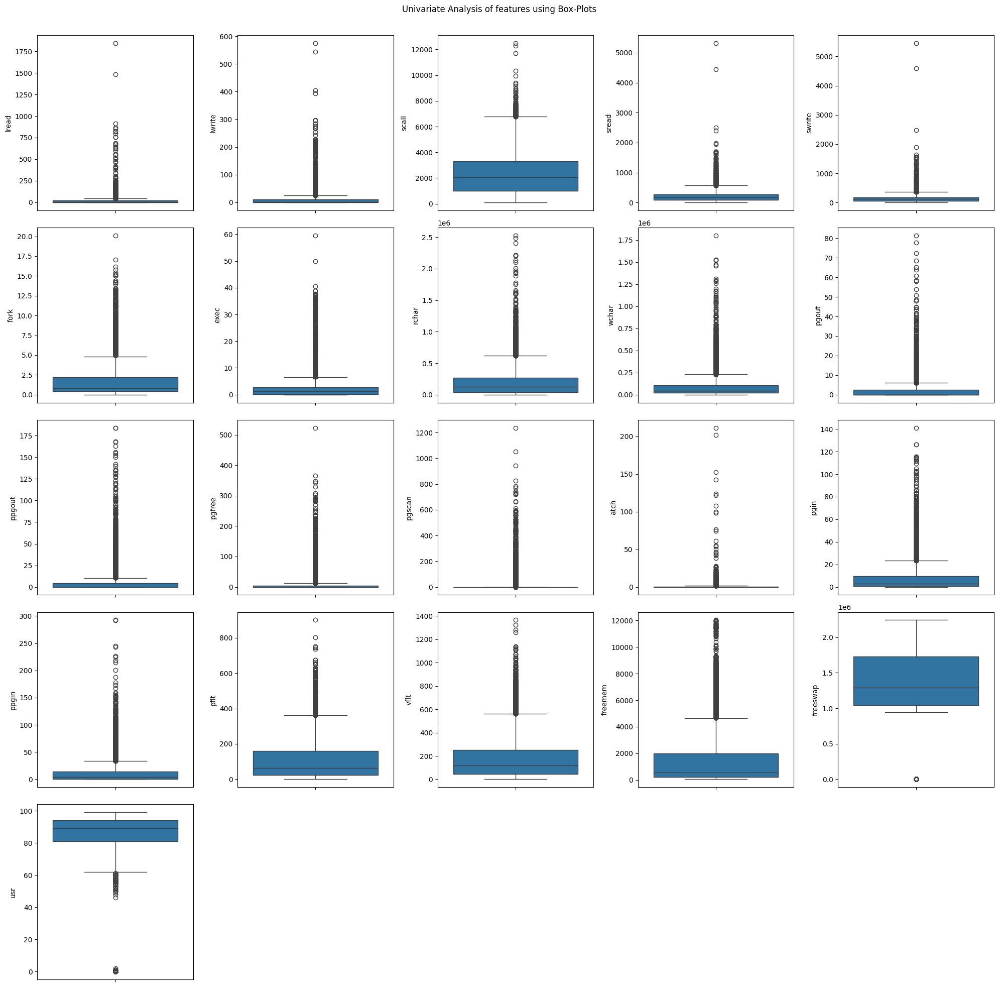

In [15]:
import numpy as np
n = len(data_numeric.columns)
ncols = 5
nrows = n//nclos if n % ncols == 0 else n//ncols + 1

fig, axs = plt.subplots(nrows = nrows, ncols = ncols, figsize=(20,4*nrows))
axs = np.ravel(axs)
for idx in range(nrows * ncols):
    ax = axs[idx]  # get the current axis
    if idx < n:
        sns.boxplot(data_numeric[data_numeric.columns[idx]], ax=ax)
    else:
        fig.delaxes(ax)
fig.suptitle('Univariate Analysis of features using Box-Plots')
plt.subplots_adjust(top=1)
plt.tight_layout() 
plt.subplots_adjust(top=0.95)
plt.savefig('./images/boxplots.svg')
plt.show()

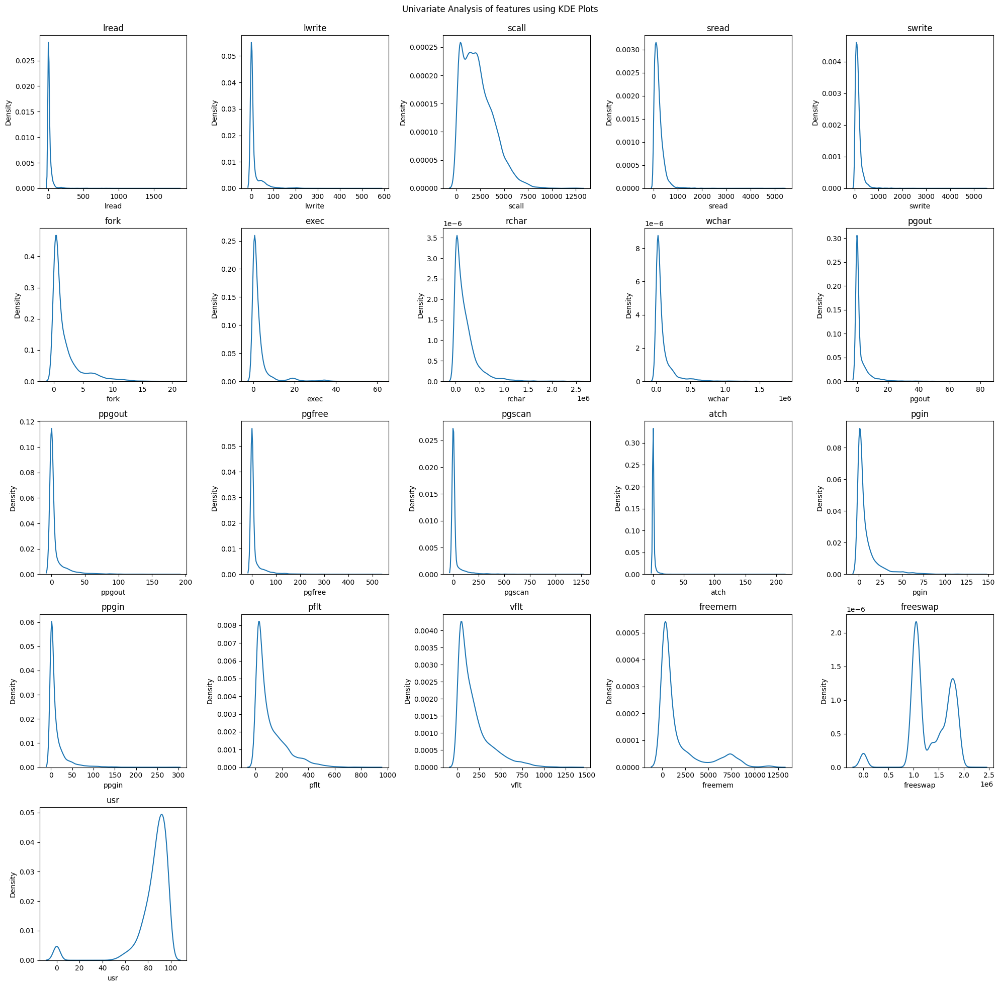

In [16]:
n = len(data_numeric.columns)
ncols = 5
nrows = n//nclos if n % ncols == 0 else n//ncols + 1

fig, axs = plt.subplots(nrows = nrows, ncols = ncols, figsize=(20,4*nrows))
axs = np.ravel(axs)
for idx in range(nrows * ncols):
    ax = axs[idx]  # get the current axis
    if idx < n:
        sns.kdeplot(data_numeric[data_numeric.columns[idx]], ax=ax)
        ax.set_title(data_numeric.columns[idx])
    else:
        fig.delaxes(ax)
fig.suptitle('Univariate Analysis of features using KDE Plots')
plt.subplots_adjust(top=1)
plt.tight_layout() 
plt.subplots_adjust(top=0.95)
plt.savefig('./images/kdeplots.svg')
plt.show()

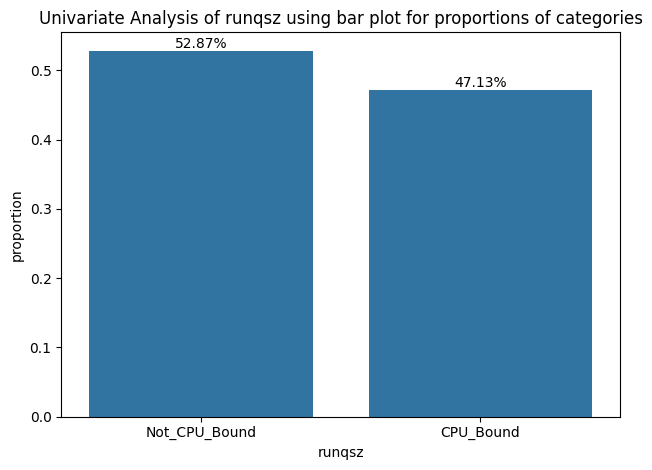

In [17]:
ax = sns.barplot(data['runqsz'].value_counts(normalize=True))
for i in ax.containers:
    ax.bar_label(i,fmt='%.2f%%',labels=[f'{j.get_height()*100:.2f}%' for j in i])
    ax.set_title('Univariate Analysis of runqsz using bar plot for proportions of categories')
plt.tight_layout()
plt.savefig('./images/runqsz_propotion.svg')
plt.show()

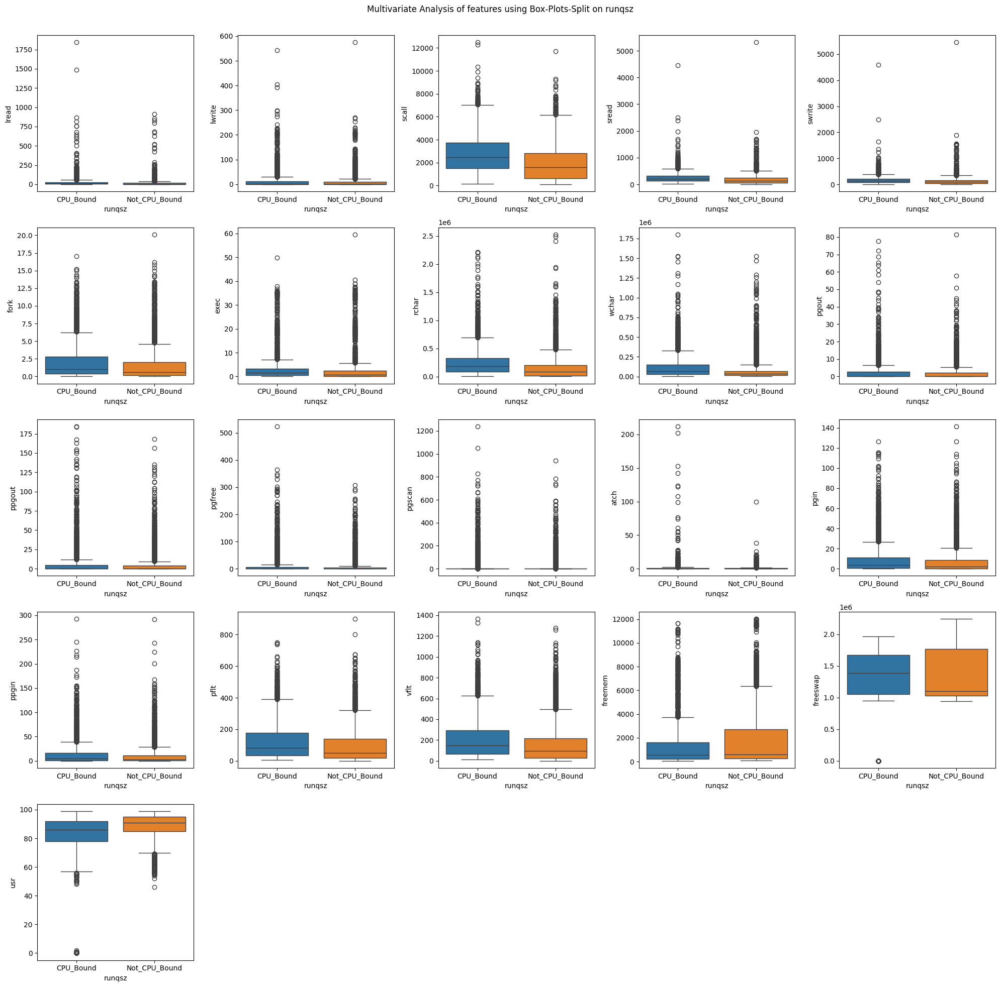

In [18]:
n = len(data_numeric.columns)
ncols = 5
nrows = n//nclos if n % ncols == 0 else n//ncols + 1

fig, axs = plt.subplots(nrows = nrows, ncols = ncols, figsize=(20,4*nrows))
axs = np.ravel(axs)
for idx in range(nrows * ncols):
    ax = axs[idx]  # get the current axis
    if idx < n:
        sns.boxplot(data=data,y=data[data_numeric.columns[idx]],x=data['runqsz'], hue=data['runqsz'], ax=ax)
    else:
        fig.delaxes(ax)
fig.suptitle('Multivariate Analysis of features using Box-Plots-Split on runqsz')
plt.subplots_adjust(top=1)
plt.tight_layout() 
plt.subplots_adjust(top=0.95)
plt.savefig('./images/boxplots_multi.svg')
plt.show()

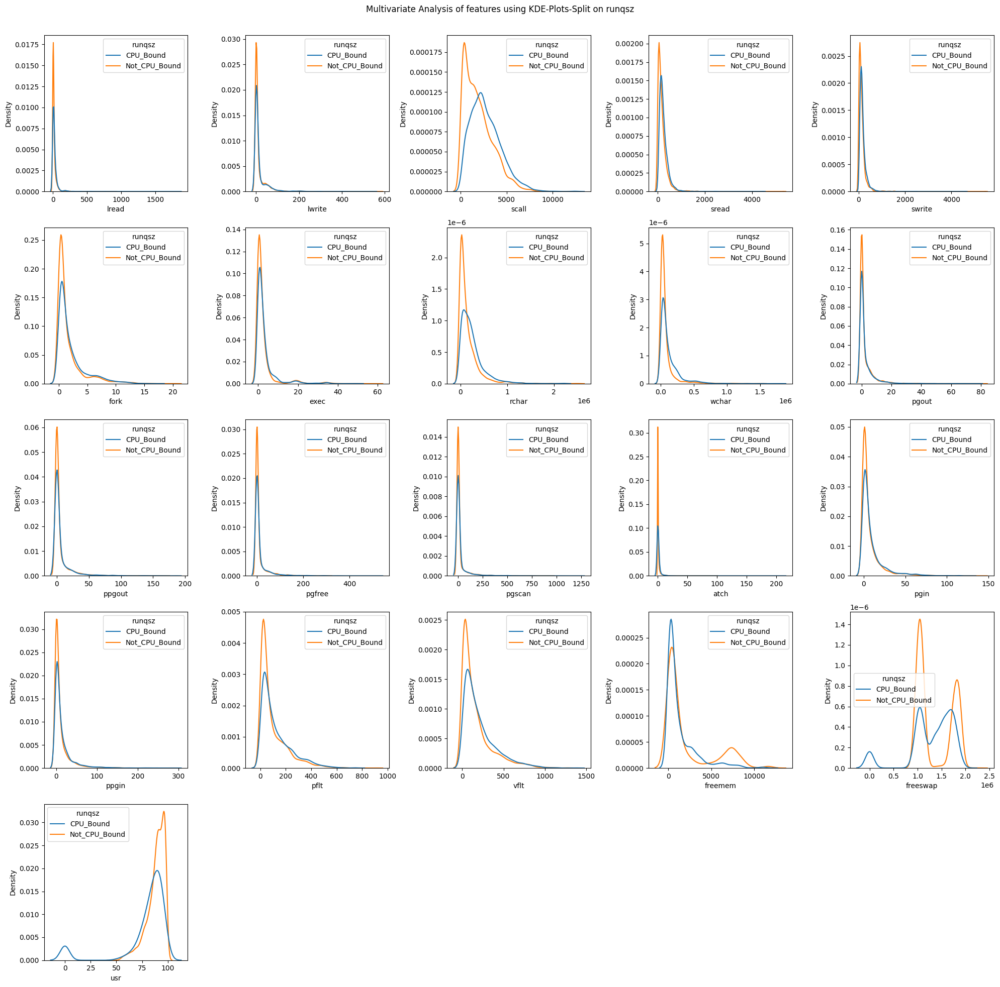

In [19]:
n = len(data_numeric.columns)
ncols = 5
nrows = n//nclos if n % ncols == 0 else n//ncols + 1

fig, axs = plt.subplots(nrows = nrows, ncols = ncols, figsize=(20,4*nrows))
axs = np.ravel(axs)
for idx in range(nrows * ncols):
    ax = axs[idx]  # get the current axis
    if idx < n:
        sns.kdeplot(data=data,x=data[data_numeric.columns[idx]], hue=data['runqsz'], ax=ax)
    else:
        fig.delaxes(ax)
fig.suptitle('Multivariate Analysis of features using KDE-Plots-Split on runqsz')
plt.subplots_adjust(top=1)
plt.tight_layout() 
plt.subplots_adjust(top=0.95)
plt.savefig('./images/kdeplots_multi.svg')
plt.show()

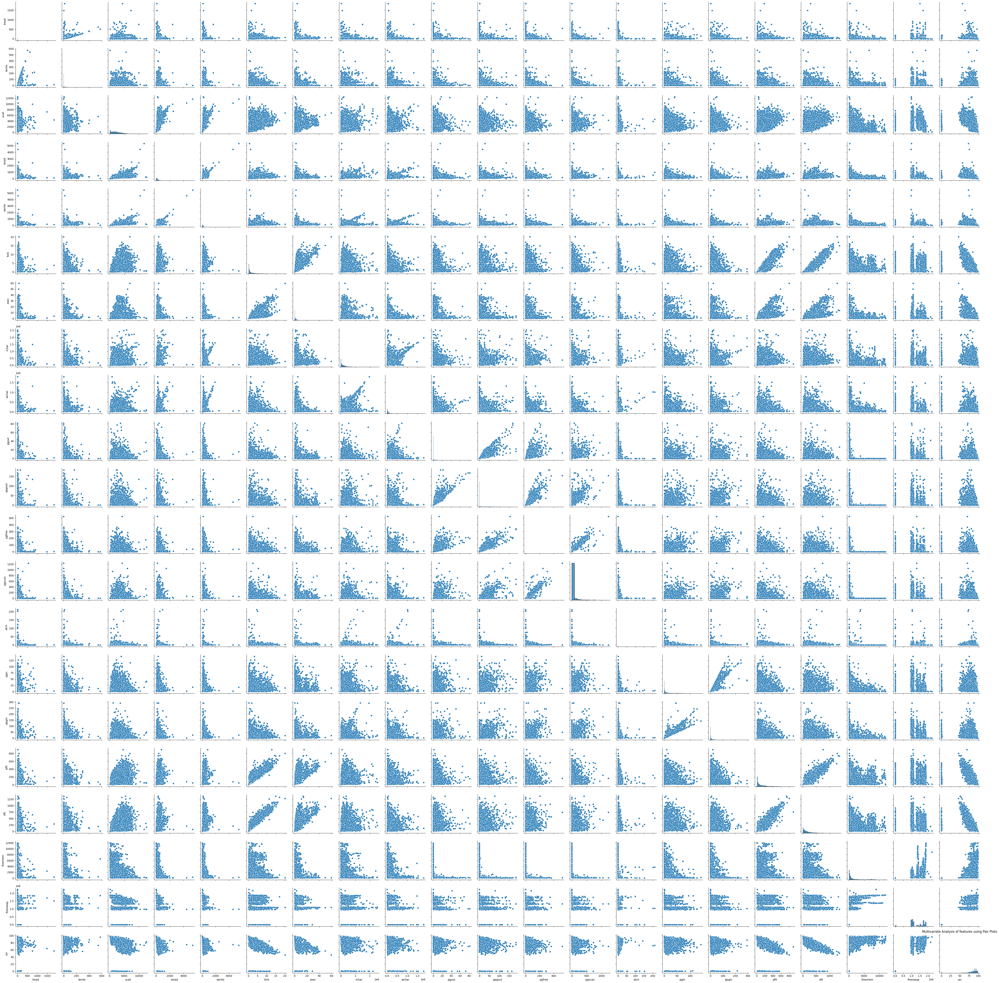

In [20]:
sns.pairplot(data_numeric)
plt.title('Multivariate Analysis of features using Pair Plots')
plt.tight_layout()
plt.savefig('./images/pairplots.jpg')
plt.show()

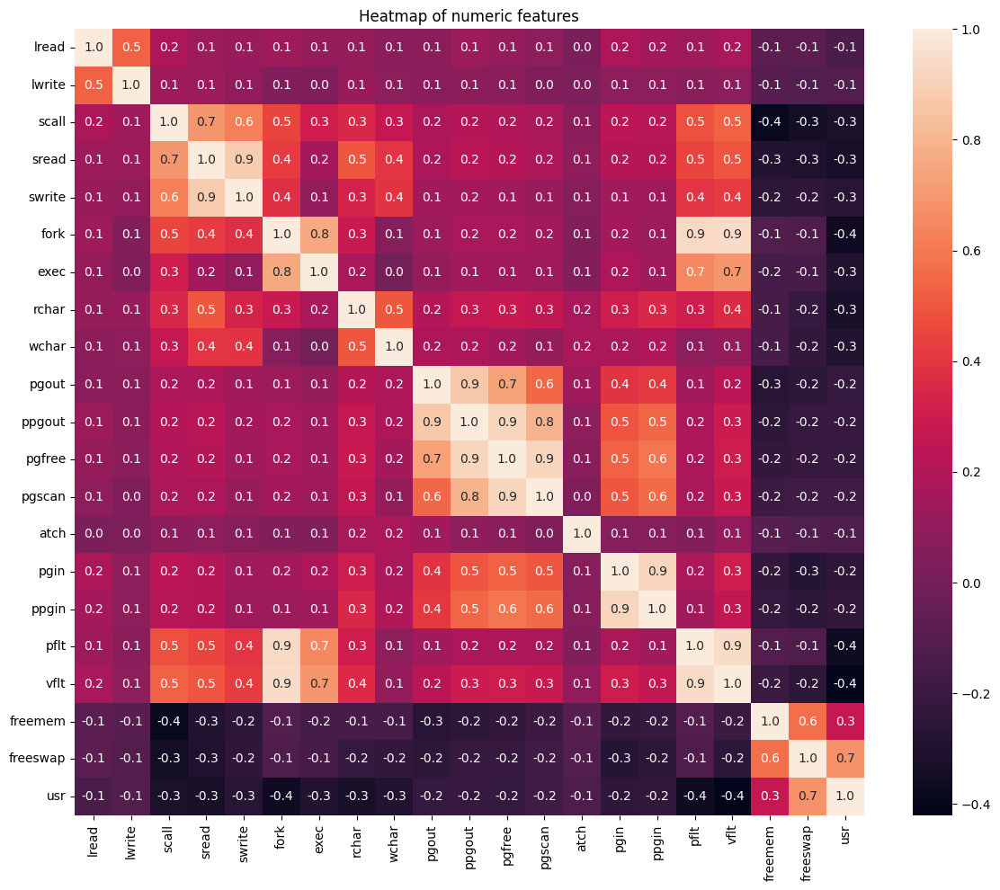

In [21]:
corr = data_numeric.corr().round(2)
matrix = np.triu(corr)
annot = True
plt.figure(figsize=(12,10))
sns.heatmap(corr,annot=annot,fmt='.1f')
plt.title('Heatmap of numeric features')
plt.tight_layout()
plt.savefig('./images/heatmap.svg')
plt.show()

In [22]:
data.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


## Question 2 : Data Pre-processing
### Prepare the data for modeling:
#### Missing Values Teatment:
- Values are missing in "rchar" and "wchar", since these states theotically possible but highly unlikely we will replace these values with the minimum values in the the series.
- Check for duplicates.
#### Outlier Detection (treat, if needed):
- Outlier values are present but these are values that genuinely captured fromt the system, we will not do any Outlier Treatments.

#### Encoding:
- "runqsz" is Label encoded, and treated as a categorical variable,i.e, we will not do any scaling or Transformation with this column.
-  This is Encoded as {'CPU_Bound': 1, 'Not_CPU_Bound': 0}


#### Feature Engineering:
- **These steps will be run post spilting the data into "Train" and "Test" this is to ensure that the Transformation, Scaling of the Train data is not influenced by the Test data.**
- All the features are highly skewed, we check transformations to check if reduce alot of this skewness, exploring varrious transformations:
    - The Boxcox transformation would be done to the following features
        - lread, scall, sread, swrite, fork, exec, rchar, wchar, pgout, ppgout, pgfree, pgscan, atch, pflt, vflt, freemem and freeswap
    - The Cube root transformation would be done to the following features
        -  lwrite, pgin and ppgin
    - We will not transform the target variable of "usr"
- We will scale the data to get all the attribute to the same scale.
    - Since all of the features follow a bell curve we will scale using zscore method.

#### Train-Test Split:
- We do a split of the data 70-30 Train-Test.
- Apply the transformation and scaling (described in Feature Engineering) to the Train and Test post the Split.
- Post the application using the heat map on the Train data we see:
    - alot features have values greater than and equal to 0.5 and less than and equal to -0.5
    - this indicates that moderate and strong correlations between features
 

In [23]:
data.isnull().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

In [24]:
data['rchar'].describe().round(2)

count       8088.00
mean      197385.73
std       239837.49
min          278.00
25%        34091.50
50%       125473.50
75%       267828.75
max      2526649.00
Name: rchar, dtype: float64

In [25]:
data_copy = data.copy()

In [26]:
data_copy['rchar'] = data_copy['rchar'].fillna(data_copy['rchar'].min())
data_copy['wchar'] = data_copy['wchar'].fillna(data_copy['rchar'].min())

In [27]:
data_copy.isnull().sum()

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
dtype: int64

In [28]:
data_copy.duplicated().sum()

0

In [29]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder

In [30]:
data_copy['runqsz']

0           CPU_Bound
1       Not_CPU_Bound
2       Not_CPU_Bound
3       Not_CPU_Bound
4       Not_CPU_Bound
            ...      
8187        CPU_Bound
8188    Not_CPU_Bound
8189    Not_CPU_Bound
8190        CPU_Bound
8191        CPU_Bound
Name: runqsz, Length: 8192, dtype: object

In [31]:
#le = LabelEncoder()
#data_copy['runqsz'] = le.fit_transform(data_copy['runqsz'])
data_copy['runqsz'] = data_copy['runqsz'].map({'CPU_Bound': 1, 'Not_CPU_Bound': 0})
data_copy['runqsz'] = data_copy['runqsz'].astype('category')

In [32]:
data_copy['runqsz']

0       1
1       0
2       0
3       0
4       0
       ..
8187    1
8188    0
8189    0
8190    1
8191    1
Name: runqsz, Length: 8192, dtype: category
Categories (2, int64): [0, 1]

In [33]:
data_copy_numeric = data_copy[data_numeric.columns]
data_copy_numeric.head()
data_copy_numeric.describe().round().T
data_copy_numeric.isna().sum()

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
freemem     0
freeswap    0
usr         0
dtype: int64

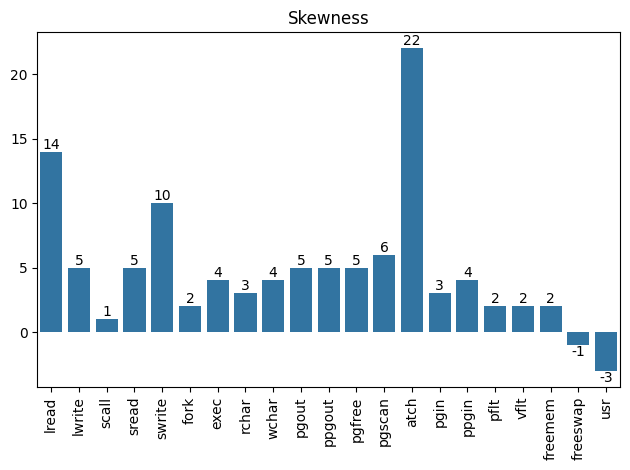

In [34]:
skew = []
for col in data_copy_numeric.columns:
    sk = data_copy_numeric[col].skew().round()
    skew.append(sk)

for idx, val in enumerate(skew):
    if val == 0:
        print(f'Skew is 0 for {data_copy_numeric.columns[idx]}')

ax = sns.barplot(y=skew,x=data_copy_numeric.columns)
for i in ax.containers:
    ax.bar_label(i,)
ax.set_xticks(data_copy_numeric.columns)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_title("Skewness")
ax.set_xlabel("")
plt.tight_layout()
plt.savefig('./images/skewness.svg')
plt.show()


In [35]:
data_copy_numeric.min().min()
data_positive = data_copy_numeric + abs(data_copy_numeric.min().min()) +.0000000001 # adding a small + value to the zero so that log transform does not throw error as log0 is an exception

Skew is 0 for swrite
Skew is 0 for wchar
Skew is 0 for pgout
Skew is 0 for ppgout
Skew is 0 for pgfree
Skew is 0 for atch
Skew is 0 for vflt
Skew is 0 for freemem


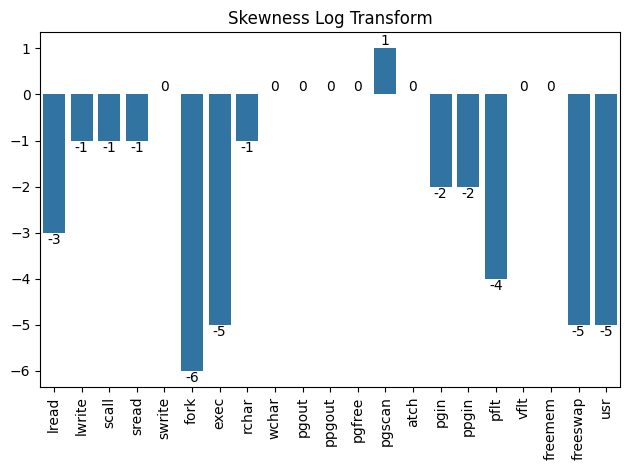

In [36]:
data_log_trasformed = data_positive.apply(np.log)
skew = []
for col in data_copy_numeric.columns:
    sk = data_log_trasformed[col].skew().round()
    skew.append(sk)
for idx, val in enumerate(skew):
    if val == 0:
        print(f'Skew is 0 for {data_copy_numeric.columns[idx]}')
ax = sns.barplot(y=skew,x=data_copy_numeric.columns)
for i in ax.containers:
    ax.bar_label(i,)
ax.set_xticks(data_copy_numeric.columns)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_title("Skewness Log Transform")
ax.set_xlabel("")
plt.tight_layout()
plt.savefig('./images/skewness_log_transform.svg')
plt.show()

Skew is 0 for scall


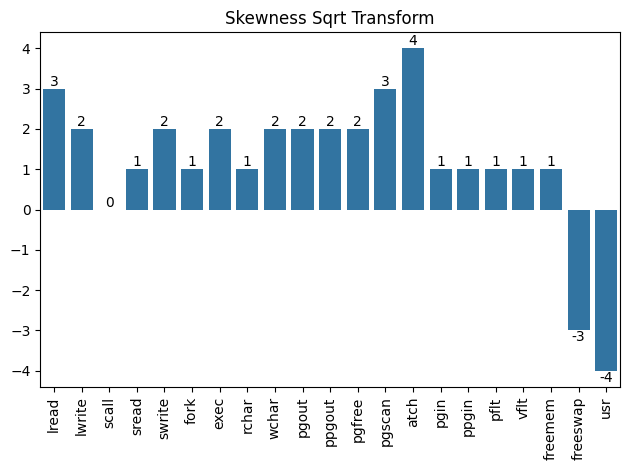

In [37]:
data_sqrt_trasformed = data_positive.apply(np.sqrt)
skew = []
for col in data_copy_numeric.columns:
    sk = data_sqrt_trasformed[col].skew().round()
    skew.append(sk)

for idx, val in enumerate(skew):
    if val == 0:
        print(f'Skew is 0 for {data_copy_numeric.columns[idx]}')
        
ax = sns.barplot(y=skew,x=data_copy_numeric.columns)
for i in ax.containers:
    ax.bar_label(i,)
ax.set_xticks(data_copy_numeric.columns)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_title("Skewness Sqrt Transform")
ax.set_xlabel("")
plt.tight_layout()
plt.savefig('./images/skewness_Sqrt_transform.svg')
plt.show()

Skew is 0 for scall
Skew is 0 for sread
Skew is 0 for rchar
Skew is 0 for pgin
Skew is 0 for vflt


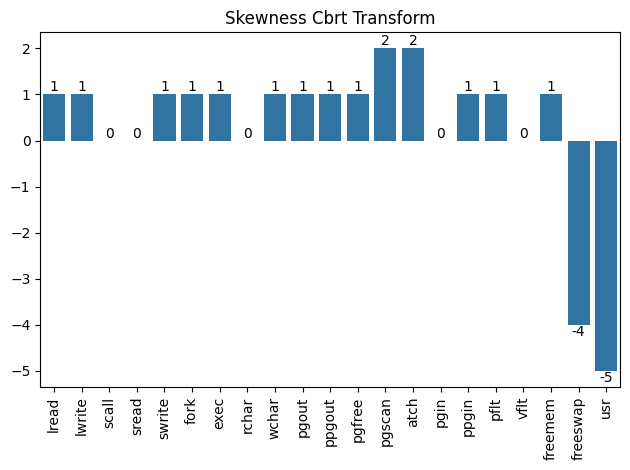

In [38]:
data_cbrt_trasformed = data_positive.apply(np.cbrt)
skew = []
for col in data_copy_numeric.columns:
    sk = data_cbrt_trasformed[col].skew().round()
    skew.append(sk)

for idx, val in enumerate(skew):
    if val == 0:
        print(f'Skew is 0 for {data_copy_numeric.columns[idx]}')
        
ax = sns.barplot(y=skew,x=data_copy_numeric.columns)
for i in ax.containers:
    ax.bar_label(i,)
ax.set_xticks(data_copy_numeric.columns)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_title("Skewness Cbrt Transform")
ax.set_xlabel("")
plt.tight_layout()
plt.savefig('./images/skewness_cbrt_transform.svg')
plt.show()

Skew is 0 for pgout
Skew is 0 for ppgout
Skew is 0 for pgfree
Skew is 0 for atch


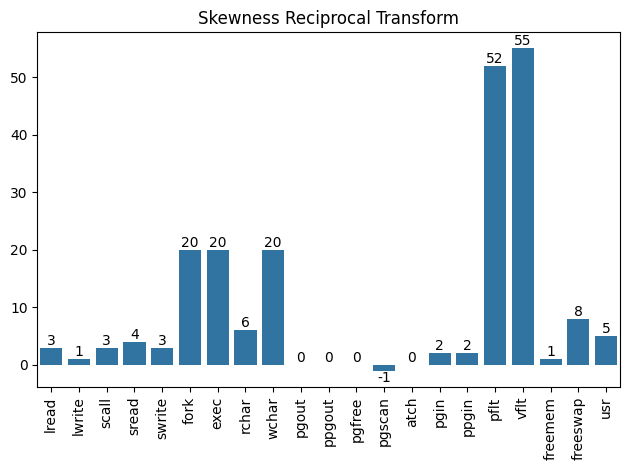

In [39]:
data_reciprocal_trasformed = data_positive.apply(lambda x: 1/x)
skew = []
for col in data_copy_numeric.columns:
    sk = data_reciprocal_trasformed[col].skew().round()
    skew.append(sk)

for idx, val in enumerate(skew):
    if val == 0:
        print(f'Skew is 0 for {data_copy_numeric.columns[idx]}')
        
ax = sns.barplot(y=skew,x=data_copy_numeric.columns)
for i in ax.containers:
    ax.bar_label(i,)
ax.set_xticks(data_copy_numeric.columns)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_title("Skewness Reciprocal Transform")
ax.set_xlabel("")
plt.tight_layout()
plt.savefig('./images/skewness_inverse_transform.svg')
plt.show()

In [40]:
from scipy.stats import boxcox

Skew is 0 for lread
Skew is 0 for scall
Skew is 0 for sread
Skew is 0 for swrite
Skew is 0 for fork
Skew is 0 for exec
Skew is 0 for rchar
Skew is 0 for wchar
Skew is 0 for pgout
Skew is 0 for ppgout
Skew is 0 for pgfree
Skew is 0 for atch
Skew is 0 for pflt
Skew is 0 for vflt
Skew is 0 for freemem


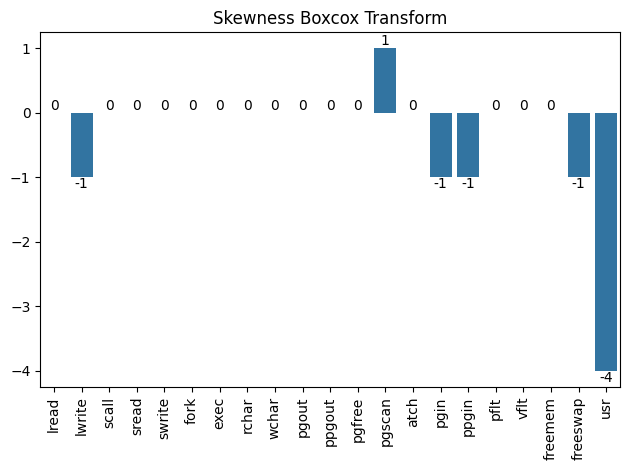

In [41]:
data_boxcox_trasformed = data_positive.apply(lambda x: pd.Series(boxcox(x)[0]))
skew = []
for col in data_copy_numeric.columns:
    sk = data_boxcox_trasformed[col].skew().round()
    skew.append(sk)

for idx, val in enumerate(skew):
    if val == 0:
        print(f'Skew is 0 for {data_copy_numeric.columns[idx]}')
        
ax = sns.barplot(y=skew,x=data_copy_numeric.columns)
for i in ax.containers:
    ax.bar_label(i,)
ax.set_xticks(data_copy_numeric.columns)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_title("Skewness Boxcox Transform")
ax.set_xlabel("")
plt.tight_layout()
plt.savefig('./images/skewness_boxcox_transform.svg')
plt.show()

In [42]:
# - lread, scall, sread, swrite, fork, exec, rchar, wchar, pgout, ppgout, pgfree, pgscan, atch, pflt, vflt, freemem and freeswap
#     - The Cube root transformation would be done to the following features
#         -  lwrite, pgin and ppgin

boxcox_cols = ['lread', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar', 'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pflt', 'vflt', 'freemem','freeswap']
cbrt_cols = ['lwrite', 'pgin', 'ppgin']

In [43]:
from sklearn.model_selection import train_test_split

X = data_copy.drop('usr', axis=1)
y = data_copy['usr']

X_train, X_test, y_train, y_test =  train_test_split(X, y, test_size = 0.3, random_state = 42)

In [44]:
X_train_numeric_cols = X_train.select_dtypes(include=[np.number]).columns.tolist()
X_train_numeric = X_train[X_train_numeric_cols]
X_test_numeric = X_test[X_train_numeric_cols]

In [45]:
X_train_numeric

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,ppgout,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap
1310,26,36,5731,312,224,0.80,0.80,155004.0,264757.0,0.00,0.00,0.00,0.00,3.20,0.20,0.20,48.80,134.00,249,1383946
7365,15,3,1203,61,34,1.60,1.80,163076.0,33674.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,127.80,199.40,2744,1542915
2284,39,16,5213,754,767,6.99,4.99,435848.0,314796.0,6.19,9.98,10.18,5.19,5.39,15.77,17.56,348.10,617.17,236,1002172
7076,2,0,2585,203,145,0.60,0.60,329604.0,126738.0,1.00,1.80,1.00,0.00,0.80,29.46,30.46,49.90,194.39,451,1057294
3114,2,1,1827,65,88,0.40,0.20,4487.0,8828.0,0.00,0.00,0.00,0.00,0.00,0.20,0.20,17.40,17.00,689,1752789
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5226,0,0,193,44,22,0.20,0.20,301404.0,256088.0,0.00,0.00,0.00,0.00,0.00,2.60,5.00,15.60,18.80,3652,1819909
5390,67,63,5337,234,146,6.40,18.00,141332.0,43164.0,3.20,3.40,3.40,0.00,1.80,64.80,69.20,491.20,601.60,316,1543805
860,0,0,138,9,10,0.20,0.20,1046.0,7427.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,15.63,16.83,6363,1852585
7603,1,1,1515,191,127,0.40,1.80,4317.0,17371.0,1.60,1.60,1.60,0.00,0.40,0.60,0.60,27.60,32.20,240,1103902


In [46]:
X_test_numeric

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,ppgout,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap
5670,14,7,1495,197,169,0.80,1.00,10304.0,24435.0,7.98,14.57,24.75,38.52,1.0,2.00,2.00,63.07,106.79,186,974392
5369,10,8,3158,324,172,0.60,2.20,1037534.0,884253.0,0.00,0.00,0.00,0.00,0.0,26.00,45.80,46.00,79.20,510,1032922
2111,2,0,813,117,113,1.80,0.60,59903.0,24550.0,0.60,2.20,7.20,14.00,0.0,0.00,0.00,96.00,135.60,179,1761718
6659,48,68,3283,134,125,0.40,0.40,33832.0,23626.0,4.20,9.00,9.00,0.00,0.6,1.80,2.20,36.40,56.20,461,1129531
5227,12,2,2357,113,96,6.99,20.16,55137.0,36291.0,0.00,0.00,0.00,0.00,0.0,8.38,12.18,231.14,423.35,530,1077027
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170,1,0,3483,294,283,0.80,2.60,621569.0,553056.0,18.80,70.80,183.60,384.60,6.0,44.80,83.20,41.80,75.20,132,994390
6059,12,5,1548,178,72,1.40,2.00,210346.0,213026.0,0.00,0.00,0.00,0.00,0.0,1.40,1.60,87.00,180.40,1990,1559387
135,0,0,1220,61,96,0.20,0.20,17422.0,107652.0,0.00,0.00,0.00,0.00,0.0,1.00,1.80,15.60,17.00,4371,1782864
3661,116,44,3078,172,154,3.80,6.20,314895.0,178270.0,0.00,0.00,0.00,0.00,0.0,1.60,1.80,247.80,368.40,1093,1515243


In [47]:
# adding small values to make zero values positive as transformation like boxcox expects +ve values
X_train_numeric.min().min()
X_train_positive = X_train_numeric + abs(X_train_numeric.min().min()) +.0000000001 

X_test_numeric.min().min()
X_test_positive = X_test_numeric + abs(X_test_numeric.min().min()) +.0000000001

In [48]:
# applying transformations to Train and Test
boxcox_cols = ['lread', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar', 'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pflt', 'vflt', 'freemem','freeswap']
cbrt_cols = ['lwrite', 'pgin', 'ppgin']

X_train_positive_bc_cols = X_train_positive[boxcox_cols]
X_train_positive_cbrt_cols = X_train_positive[cbrt_cols]

X_test_positive_bc_cols = X_test_positive[boxcox_cols]
X_test_positive_cbrt_cols = X_test_positive[cbrt_cols]


In [49]:
X_test_positive_cbrt_cols

,lwrite,pgin,ppgin
5670,7.000000e+00,2.000000e+00,2.000000e+00
5369,8.000000e+00,2.600000e+01,4.580000e+01
2111,1.000000e-10,1.000000e-10,1.000000e-10
6659,6.800000e+01,1.800000e+00,2.200000e+00
5227,2.000000e+00,8.380000e+00,1.218000e+01
...,...,...,...
170,1.000000e-10,4.480000e+01,8.320000e+01
6059,5.000000e+00,1.400000e+00,1.600000e+00
135,1.000000e-10,1.000000e+00,1.800000e+00
3661,4.400000e+01,1.600000e+00,1.800000e+00


In [50]:
# Apply the Box-Cox transformation to each column of the training data
X_train_boxcox = X_train_positive_bc_cols.apply(lambda x:boxcox(x)[0])

# Get the lambdas
lambdas = X_train_positive_bc_cols.apply(lambda x: boxcox(x)[1])

# Apply same transformation on test
X_test_boxcox = X_test_positive_bc_cols.apply(lambda x: boxcox(x, lmbda=lambdas[x.name]))

In [51]:
X_test_boxcox

,lread,scall,sread,swrite,fork,exec,rchar,wchar,pgout,ppgout,pgfree,pgscan,atch,pflt,vflt,freemem,freeswap
5670,3.444041e+00,46.374280,10.503273,6.945778,-0.219749,1.000000e-10,36.323776,9.863498,1.976515,2.517021,2.982438,2.749403,1.000000e-10,5.304346,5.924094,3.450758,290861.958655
5369,2.901162e+00,63.882428,12.339398,6.977182,-0.493268,8.255124e-01,123.791683,13.253722,-42.153608,-41.540388,-41.052242,-257.774088,-3.406371e+01,4.805989,5.458471,3.828630,306631.357782
2111,7.417905e-01,35.589087,8.798062,6.244136,0.612238,-4.960335e-01,58.624401,9.867971,-0.517156,0.774013,1.886788,2.143487,-3.406371e+01,5.996301,6.306112,3.435056,497142.541287
6659,5.762985e+00,64.946097,9.222084,6.417087,-0.860823,-8.694247e-01,50.286244,9.831415,1.386650,2.087477,2.089446,-257.774088,-5.150305e-01,4.447841,4.940585,3.793666,332477.425769
5227,3.190936e+00,56.388192,8.691507,5.968867,2.229790,3.591267e+00,57.339297,10.240032,-42.153608,-41.540388,-41.052242,-257.774088,-3.406371e+01,7.555879,8.255214,3.841786,318458.125111
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170,1.000000e-10,66.599368,11.963690,7.892244,-0.219749,1.010289e+00,108.422284,12.813696,2.736154,3.860152,4.632892,3.805106,1.741279e+00,4.658330,5.379114,3.306647,296259.754197
6059,3.190936e+00,47.076290,10.154716,5.495329,0.344392,7.216786e-01,81.736865,11.916081,-42.153608,-41.540388,-41.052242,-257.774088,-3.406371e+01,5.831159,6.774592,4.245266,445170.667979
135,-5.107009e+00,42.472075,6.941157,5.968867,-1.443518,-1.468568e+00,41.983850,11.271421,-42.153608,-41.540388,-41.052242,-257.774088,-3.406371e+01,3.228854,3.265803,4.445228,502540.410993
3661,7.798403e+00,63.188585,10.038746,6.780919,1.465634,2.031270e+00,90.840220,11.748047,-42.153608,-41.540388,-41.052242,-257.774088,-3.406371e+01,7.686252,8.005370,4.073819,433749.000482


In [52]:
# Apply the Cbrt transformation to each column of the training data
X_train_cbrt = X_train_positive_cbrt_cols.apply(np.cbrt)

# Apply the Cbrt transformation to each column of the test data
X_test_cbrt = X_test_positive_cbrt_cols.apply(np.cbrt)

In [53]:
X_test_cbrt

,lwrite,pgin,ppgin
5670,1.912931,1.259921,1.259921
5369,2.000000,2.962496,3.577848
2111,0.000464,0.000464,0.000464
6659,4.081655,1.216440,1.300591
5227,1.259921,2.031178,2.300819
...,...,...,...
170,0.000464,3.551616,4.365572
6059,1.709976,1.118689,1.169607
135,0.000464,1.000000,1.216440
3661,3.530348,1.169607,1.216440


In [54]:
X_train_transformed = pd.concat([X_train_boxcox,X_train_cbrt],axis=1)
X_train_transformed.head()

,lread,scall,sread,swrite,fork,exec,rchar,wchar,pgout,ppgout,pgfree,pgscan,atch,pflt,vflt,freemem,freeswap,lwrite,pgin,ppgin
1310,4.540045,82.232445,12.192442,7.456200,-0.219749,-0.220290,75.434084,12.120981,-4.215361e+01,-41.540388,-4.105224e+01,-257.774088,1.141735,4.897928,6.286916,3.566838,399586.621973,3.301927,0.584804,0.584804
7365,3.559792,42.214507,6.941157,4.330181,0.485552,0.608219,76.449030,10.168841,-4.215361e+01,-41.540388,-4.105224e+01,-257.774088,-34.063710,6.487002,6.942056,4.330186,440912.394630,1.442250,0.000464,0.000464
2284,5.332463,79.007728,15.995197,9.886325,2.229790,1.766505,98.872358,12.283989,1.745262e+00,2.180459,2.200445e+00,1.443684,1.639875,8.338053,8.949990,3.545934,298357.452025,2.519842,2.507710,2.599211
7076,0.741791,58.657248,10.607992,6.675027,-0.493268,-0.496033,91.929276,11.425779,1.000000e-10,0.579734,1.000000e-10,-257.774088,-0.223943,4.932773,6.899345,3.785995,313172.512352,0.000464,3.088476,3.123033
3114,0.741791,50.556279,7.109943,5.824019,-0.860823,-1.468568,28.754123,8.891078,-4.215361e+01,-41.540388,-4.105224e+01,-257.774088,-34.063710,3.379394,3.265803,3.929241,494861.422121,1.000000,0.584804,0.584804


In [55]:
X_test_transformed = pd.concat([X_test_boxcox,X_test_cbrt],axis=1)
X_test_transformed.head()

,lread,scall,sread,swrite,fork,exec,rchar,wchar,pgout,ppgout,pgfree,pgscan,atch,pflt,vflt,freemem,freeswap,lwrite,pgin,ppgin
5670,3.444041,46.374280,10.503273,6.945778,-0.219749,1.000000e-10,36.323776,9.863498,1.976515,2.517021,2.982438,2.749403,1.000000e-10,5.304346,5.924094,3.450758,290861.958655,1.912931,1.259921,1.259921
5369,2.901162,63.882428,12.339398,6.977182,-0.493268,8.255124e-01,123.791683,13.253722,-42.153608,-41.540388,-41.052242,-257.774088,-3.406371e+01,4.805989,5.458471,3.828630,306631.357782,2.000000,2.962496,3.577848
2111,0.741791,35.589087,8.798062,6.244136,0.612238,-4.960335e-01,58.624401,9.867971,-0.517156,0.774013,1.886788,2.143487,-3.406371e+01,5.996301,6.306112,3.435056,497142.541287,0.000464,0.000464,0.000464
6659,5.762985,64.946097,9.222084,6.417087,-0.860823,-8.694247e-01,50.286244,9.831415,1.386650,2.087477,2.089446,-257.774088,-5.150305e-01,4.447841,4.940585,3.793666,332477.425769,4.081655,1.216440,1.300591
5227,3.190936,56.388192,8.691507,5.968867,2.229790,3.591267e+00,57.339297,10.240032,-42.153608,-41.540388,-41.052242,-257.774088,-3.406371e+01,7.555879,8.255214,3.841786,318458.125111,1.259921,2.031178,2.300819


In [56]:
# Scale Train and Test
scaler = StandardScaler()
# fit and transform train data
X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train_transformed), columns=X_train_transformed.columns,index=X_train_transformed.index)
# transform test data
X_test_scaled = pd.DataFrame(scaler.transform(X_test_transformed), columns=X_test_transformed.columns,index=X_test_transformed.index)

In [57]:
X_test_scaled

,lread,scall,sread,swrite,fork,exec,rchar,wchar,pgout,ppgout,pgfree,pgscan,atch,pflt,vflt,freemem,freeswap,lwrite,pgin,ppgin
5670,0.411369,-0.303095,0.245636,0.522328,-0.174052,-0.126713,-1.241644,-0.600190,1.251894,1.248099,1.251261,1.913059,1.130157,-0.088877,-0.060687,-1.045401,-0.814929,0.365906,-0.234329,-0.357952
5369,0.234398,0.663821,0.863241,0.543968,-0.387131,0.432892,2.113585,2.483163,-0.826560,-0.826317,-0.827253,-0.522577,-0.887543,-0.373766,-0.322353,-0.158830,-0.676632,0.429620,1.467092,1.635449
2111,-0.469527,-0.898725,-0.327934,0.038831,0.474090,-0.462969,-0.386202,-0.596121,1.134447,1.166031,1.199545,1.907395,-0.887543,0.306682,0.153996,-1.082241,0.994131,-1.033575,-1.492933,-1.441077
6659,1.167312,0.722564,-0.185309,0.158010,-0.673467,-0.716087,-0.706050,-0.629369,1.224113,1.227874,1.209111,-0.522577,1.099650,-0.578502,-0.613390,-0.240864,-0.449965,1.952907,-0.277780,-0.322976
5227,0.328860,0.249940,-0.363775,-0.150854,1.734211,2.307767,-0.435498,-0.257738,-0.826560,-0.826317,-0.827253,-0.522577,-0.887543,1.198222,1.249333,-0.127963,-0.572913,-0.111945,0.536405,0.537213
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170,-0.711340,0.813869,0.736866,1.174530,-0.174052,0.558151,1.524022,2.082966,1.287672,1.311340,1.329166,1.922929,1.233298,-0.458175,-0.366950,-1.383517,-0.767590,-1.033575,2.055813,2.312887
6059,0.328860,-0.264325,0.128394,-0.477166,0.265430,0.362504,0.500381,1.266600,-0.826560,-0.826317,-0.827253,-0.522577,-0.887543,0.212278,0.417267,0.818688,0.538343,0.217390,-0.375466,-0.435621
135,-2.376152,-0.518601,-0.952529,-0.150854,-1.127404,-1.122239,-1.024526,0.680293,-0.826560,-0.826317,-0.827253,-0.522577,-0.887543,-1.275342,-1.554567,1.287844,1.041470,-1.033575,-0.494074,-0.395345
3661,1.830829,0.625503,0.089386,0.408725,1.138911,1.250262,0.849582,1.113776,-0.826560,-0.826317,-0.827253,-0.522577,-0.887543,1.272751,1.108928,0.416436,0.438176,1.549479,-0.324582,-0.395345


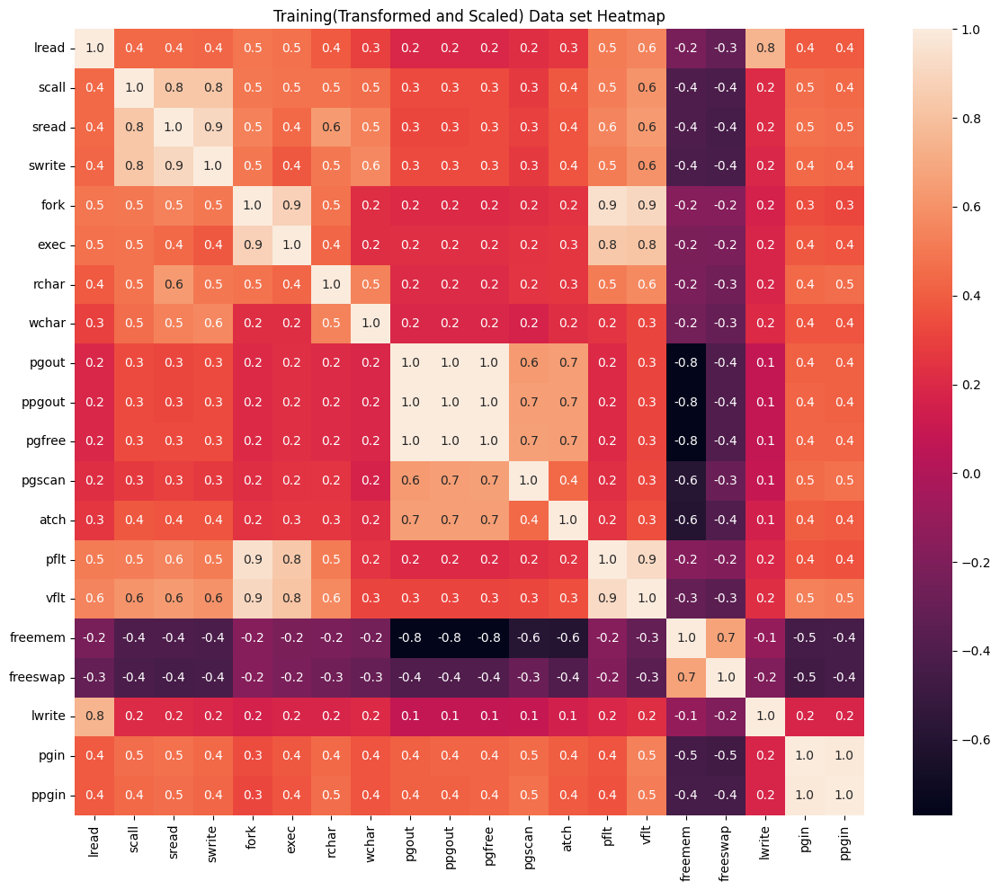

In [58]:
#check the correlation for the transformed and scaled values for training dataset
corr = X_train_scaled.corr().round(2)
matrix = np.triu(corr)
annot = True
plt.figure(figsize=(12,10))
sns.heatmap(corr,annot=annot,fmt='.1f')
plt.title('Training(Transformed and Scaled) Data set Heatmap')
plt.tight_layout()
plt.savefig('./images/heatmap_train_scaled_transformed.svg')
plt.show()

In [59]:
# adding the categorical column to the X_train_scaled and X_test_scaled
X_train_scaled = pd.concat([X_train_scaled,X_train['runqsz']],axis=1)
X_test_scaled = pd.concat([X_test_scaled,X_test['runqsz']],axis=1)

In [60]:
X_train_scaled.columns

Index(['lread', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar', 'wchar',
       'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pflt', 'vflt',
       'freemem', 'freeswap', 'lwrite', 'pgin', 'ppgin', 'runqsz'],
      dtype='object')

In [61]:
X_test_scaled.columns

Index(['lread', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar', 'wchar',
       'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pflt', 'vflt',
       'freemem', 'freeswap', 'lwrite', 'pgin', 'ppgin', 'runqsz'],
      dtype='object')

## Question 3 : Model Building - Linear regression
### Apply linear Regression using Sklearn:
- We run LinearRegression using sklearn.linear_model
- Fit the same to the X_train_scaled
- running the model with all the features and using sklearn we get
    - The MSE in training is ~124 and in test it is 133, there is more error in test.
    - By the R2 we see that in the training the model explains ~62.7% of the variance in training and ~62.4% in testing.
### Using Statsmodels Perform checks for significant variables using the appropriate method:
- We would check to run VIF as we know that there are multicolinearity so we would like to run this to get and remove features with Vif more than 5.
- Using Statsmodeles we would like to run the model see what are the results and review the summary to get the p value of the features low p values means significant.
- Results with all features:
    - MSE: 124.11929490749988
    - R-squared: 0.627402382682
- ppgout has the highest vif (5951.473458) and high p>|t| value (0.808) dropping the same and rerunning, vif and Statsmodeles
- pgout has the high vif (350.108379) and high p>|t| value (0.056) dropping the same and rerunning, vif and Statsmodeles
- swrite has a high p>|t| value (0.280) dropping the same and rerunning, vif and Statsmodeles
- pgin has a high vif (27) dropping the same and rerunning, vif and Statsmodeles
- ppgin has a high p>|t| value (0.07) dropping the same and rerunning, vif and Statsmodeles
- exec has a high p>|t| value (0.658 ) dropping the same and rerunning, vif and Statsmodeles
- pgscan has a high p>|t| value (0.481 ) dropping the same and rerunning, vif and Statsmodeles
- wchar has a high p>|t| value (0.157) dropping the same and rerunning, vif and Statsmodeles
- Results removed features on the test data:
    - Test MSE: 134.73827114064625
    - Test R-squared: 0.6197317031796956
- Even though the the "R-squared" decreases with the removal of the features, it is perffered as it removes multicolinearity and non-significant features 
### Create multiple models and check the performance of Predictions on Train and Test sets using Rsquare, RMSE & Adj Rsquare.
- We would run the multiple models after droping the features due to multicolinearity and non-significance:
    - ['ppgout','pgout','swrite','pgin','ppgin','exec','pgscan','wchar']
- checking 2 models using Decision Tree Regressor and Linear Regression and comparing the RMSE to find the best model
    - Decision Tree Regressor is performing better but overfitting, we will use cross validation to tune the hyperparameters.
| Model | Train RMSE | Test RMSE | Training Score | Test Score |
| --- | --- | --- | --- | --- |
| Linear Regression | 11.207289| 11.607682| 0.621495| 0.619732 |
| Decision Tree Regressor | 0.000000 | 3.884469 | 1.000000 |0.957414 |
    - After pruning the Decision Tree Regresso we get a model which is working well on the Training and Test.
| Model | Train RMSE | Test RMSE | Training Score | Test Score |
| --- | --- | --- | --- | --- |
| Linear Regression | 11.207289| 11.607682| 0.621495| 0.619732 |
| Decision Tree Regressor | 2.952173 | 3.238304 | 0.973736  | 0.970404 |

In [62]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import mean_squared_error, r2_score

In [63]:
# Generate and fit the Model
lr = LinearRegression()

lr.fit(X_train_scaled,y_train)

LinearRegression()

In [64]:
# Generate the predictions for the dependant variable for train and test
y_train_pred = lr.predict(X_train_scaled)
X_test_scaled = X_test_scaled[X_train_scaled.columns]
y_test_pred = lr.predict(X_test_scaled)

In [65]:
print("Training MSE: ", mean_squared_error(y_train, y_train_pred))
print("Test MSE: ", mean_squared_error(y_test, y_test_pred))

Training MSE:  123.64307079160945
Test MSE:  133.28741704301615


In [66]:
print("Training R2 Score: ", r2_score(y_train, y_train_pred))
print("Test R2 Score: ", r2_score(y_test, y_test_pred))

Training R2 Score:  0.6274024061182099
Test R2 Score:  0.6238264107336069


In [67]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [68]:
vif = pd.DataFrame()
vif['vif_factor'] = [variance_inflation_factor(X_train_scaled.values,i) for i in range(X_train_scaled.shape[1])]
vif['features'] = X_train_scaled.columns
print(vif.sort_values(by='vif_factor', ascending=False))

# Add a constant to the independent value
X1 = sm.add_constant(X_train_scaled)

# Fit the model
model = sm.OLS(y_train, X1)
results = model.fit()

print(results.summary())

# Predict the values
y_pred = results.predict(X1)

# Calculate and print MSE and R-squared
mse = results.mse_resid
r2 = results.rsquared
print(f'MSE: {mse}')
print(f'R-squared: {r2}')

     vif_factor  features
9   5951.473490    ppgout
8   5701.501285     pgout
10   377.121528    pgfree
18    27.834653      pgin
19    27.522064     ppgin
4     16.231726      fork
13    13.848992      pflt
14    13.660096      vflt
2      8.774447     sread
3      7.851904    swrite
5      5.495651      exec
15     4.392280   freemem
1      4.147530     scall
0      3.791984     lread
11     3.023255    pgscan
17     2.698327    lwrite
6      2.568197     rchar
16     2.386388  freeswap
12     1.947295      atch
7      1.879160     wchar
20     1.085173    runqsz
                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.627
Model:                            OLS   Adj. R-squared:                  0.626
Method:                 Least Squares   F-statistic:                     458.0
Date:                Wed, 01 Jan 2025   Prob (F-statistic):               0.00
Time:                        18:2

In [69]:
X_train_scaled_dropped_feature = X_train_scaled.drop('ppgout',axis=1)
vif = pd.DataFrame()
vif['vif_factor'] = [variance_inflation_factor(X_train_scaled_dropped_feature.values,i) for i in range(X_train_scaled_dropped_feature.shape[1])]
vif['features'] = X_train_scaled_dropped_feature.columns
print(vif.sort_values(by='vif_factor', ascending=False))

# Add a constant to the independent value
X1 = sm.add_constant(X_train_scaled_dropped_feature)

# Fit the model
model = sm.OLS(y_train, X1)
results = model.fit()

print(results.summary())

# Predict the values
y_pred = results.predict(X1)

# Calculate and print MSE and R-squared
mse = results.mse_resid
r2 = results.rsquared
print(f'MSE: {mse}')
print(f'R-squared: {r2}')

    vif_factor  features
9   364.999870    pgfree
8   350.108379     pgout
17   27.753067      pgin
18   27.327783     ppgin
4    16.230145      fork
12   13.847253      pflt
13   13.654138      vflt
2     8.774325     sread
3     7.851904    swrite
5     5.494903      exec
14    4.389837   freemem
1     4.147436     scall
0     3.786086     lread
16    2.693176    lwrite
6     2.566206     rchar
15    2.378289  freeswap
10    2.344719    pgscan
11    1.942312      atch
7     1.878782     wchar
19    1.085173    runqsz
                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.627
Model:                            OLS   Adj. R-squared:                  0.626
Method:                 Least Squares   F-statistic:                     481.0
Date:                Wed, 01 Jan 2025   Prob (F-statistic):               0.00
Time:                        18:20:47   Log-Likelihood:                -21948.
N

In [70]:
X_train_scaled_dropped_feature = X_train_scaled_dropped_feature.drop('pgout',axis=1)
vif = pd.DataFrame()
vif['vif_factor'] = [variance_inflation_factor(X_train_scaled_dropped_feature.values,i) for i in range(X_train_scaled_dropped_feature.shape[1])]
vif['features'] = X_train_scaled_dropped_feature.columns
print(vif.sort_values(by='vif_factor', ascending=False))

# Add a constant to the independent value
X1 = sm.add_constant(X_train_scaled_dropped_feature)

# Fit the model
model = sm.OLS(y_train, X1)
results = model.fit()

print(results.summary())

# Predict the values
y_pred = results.predict(X1)

# Calculate and print MSE and R-squared
mse = results.mse_resid
r2 = results.rsquared
print(f'MSE: {mse}')
print(f'R-squared: {r2}')

    vif_factor  features
16   27.750865      pgin
17   27.320111     ppgin
4    16.230105      fork
11   13.843633      pflt
12   13.652353      vflt
2     8.769659     sread
3     7.850357    swrite
5     5.494891      exec
13    4.389722   freemem
1     4.147382     scall
0     3.784553     lread
8     3.615606    pgfree
15    2.690879    lwrite
6     2.564288     rchar
14    2.377337  freeswap
9     2.031680    pgscan
10    1.934523      atch
7     1.878755     wchar
18    1.084819    runqsz
                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.627
Model:                            OLS   Adj. R-squared:                  0.626
Method:                 Least Squares   F-statistic:                     505.9
Date:                Wed, 01 Jan 2025   Prob (F-statistic):               0.00
Time:                        18:20:48   Log-Likelihood:                -21950.
No. Observations:         

In [71]:
X_train_scaled_dropped_feature = X_train_scaled_dropped_feature.drop('swrite',axis=1)
vif = pd.DataFrame()
vif['vif_factor'] = [variance_inflation_factor(X_train_scaled_dropped_feature.values,i) for i in range(X_train_scaled_dropped_feature.shape[1])]
vif['features'] = X_train_scaled_dropped_feature.columns
print(vif.sort_values(by='vif_factor', ascending=False))

# Add a constant to the independent value
X1 = sm.add_constant(X_train_scaled_dropped_feature)

# Fit the model
model = sm.OLS(y_train, X1)
results = model.fit()

print(results.summary())

# Predict the values
y_pred = results.predict(X1)

# Calculate and print MSE and R-squared
mse = results.mse_resid
r2 = results.rsquared
print(f'MSE: {mse}')
print(f'R-squared: {r2}')

    vif_factor  features
15   27.745126      pgin
16   27.312191     ppgin
3    15.660847      fork
10   13.808212      pflt
11   13.638086      vflt
4     5.122859      exec
2     5.085668     sread
12    4.373173   freemem
1     3.803350     scall
0     3.766564     lread
7     3.614884    pgfree
14    2.681038    lwrite
13    2.377258  freeswap
5     2.310271     rchar
8     2.030140    pgscan
9     1.932361      atch
6     1.663513     wchar
17    1.084803    runqsz
                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.627
Model:                            OLS   Adj. R-squared:                  0.626
Method:                 Least Squares   F-statistic:                     533.9
Date:                Wed, 01 Jan 2025   Prob (F-statistic):               0.00
Time:                        18:20:48   Log-Likelihood:                -21950.
No. Observations:                5734   AIC:       

In [72]:
X_train_scaled_dropped_feature = X_train_scaled_dropped_feature.drop('pgin',axis=1)
vif = pd.DataFrame()
vif['vif_factor'] = [variance_inflation_factor(X_train_scaled_dropped_feature.values,i) for i in range(X_train_scaled_dropped_feature.shape[1])]
vif['features'] = X_train_scaled_dropped_feature.columns
print(vif.sort_values(by='vif_factor', ascending=False))

# Add a constant to the independent value
X1 = sm.add_constant(X_train_scaled_dropped_feature)

# Fit the model
model = sm.OLS(y_train, X1)
results = model.fit()

print(results.summary())

# Predict the values
y_pred = results.predict(X1)

# Calculate and print MSE and R-squared
mse = results.mse_resid
r2 = results.rsquared
print(f'MSE: {mse}')
print(f'R-squared: {r2}')

    vif_factor  features
3    15.646298      fork
10   13.753028      pflt
11   13.372089      vflt
4     5.113776      exec
2     5.085636     sread
12    4.372367   freemem
1     3.798614     scall
0     3.764281     lread
7     3.614883    pgfree
14    2.680224    lwrite
13    2.367439  freeswap
5     2.267196     rchar
15    2.071376     ppgin
8     2.013293    pgscan
9     1.926941      atch
6     1.661897     wchar
16    1.084511    runqsz
                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.624
Model:                            OLS   Adj. R-squared:                  0.623
Method:                 Least Squares   F-statistic:                     559.0
Date:                Wed, 01 Jan 2025   Prob (F-statistic):               0.00
Time:                        18:20:48   Log-Likelihood:                -21971.
No. Observations:                5734   AIC:                         4.398e+

In [73]:
X_train_scaled_dropped_feature = X_train_scaled_dropped_feature.drop('ppgin',axis=1)
vif = pd.DataFrame()
vif['vif_factor'] = [variance_inflation_factor(X_train_scaled_dropped_feature.values,i) for i in range(X_train_scaled_dropped_feature.shape[1])]
vif['features'] = X_train_scaled_dropped_feature.columns
print(vif.sort_values(by='vif_factor', ascending=False))

# Add a constant to the independent value
X1 = sm.add_constant(X_train_scaled_dropped_feature)

# Fit the model
model = sm.OLS(y_train, X1)
results = model.fit()

print(results.summary())

# Predict the values
y_pred = results.predict(X1)

# Calculate and print MSE and R-squared
mse = results.mse_resid
r2 = results.rsquared
print(f'MSE: {mse}')
print(f'R-squared: {r2}')

    vif_factor  features
3    14.922872      fork
10   13.605280      pflt
11   11.835660      vflt
2     5.082120     sread
4     5.029593      exec
12    4.372363   freemem
1     3.797670     scall
0     3.713081     lread
7     3.612946    pgfree
14    2.661763    lwrite
13    2.353208  freeswap
5     2.224686     rchar
8     1.927742    pgscan
9     1.925693      atch
6     1.645301     wchar
15    1.083883    runqsz
                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.624
Model:                            OLS   Adj. R-squared:                  0.623
Method:                 Least Squares   F-statistic:                     593.5
Date:                Wed, 01 Jan 2025   Prob (F-statistic):               0.00
Time:                        18:20:48   Log-Likelihood:                -21972.
No. Observations:                5734   AIC:                         4.398e+04
Df Residuals:         

In [74]:
X_train_scaled_dropped_feature = X_train_scaled_dropped_feature.drop('exec',axis=1)
vif = pd.DataFrame()
vif['vif_factor'] = [variance_inflation_factor(X_train_scaled_dropped_feature.values,i) for i in range(X_train_scaled_dropped_feature.shape[1])]
vif['features'] = X_train_scaled_dropped_feature.columns
print(vif.sort_values(by='vif_factor', ascending=False))

# Add a constant to the independent value
X1 = sm.add_constant(X_train_scaled_dropped_feature)

# Fit the model
model = sm.OLS(y_train, X1)
results = model.fit()

print(results.summary())

# Predict the values
y_pred = results.predict(X1)

# Calculate and print MSE and R-squared
mse = results.mse_resid
r2 = results.rsquared
print(f'MSE: {mse}')
print(f'R-squared: {r2}')

    vif_factor  features
9    13.605243      pflt
10   11.819657      vflt
3    11.345938      fork
2     4.691086     sread
11    4.366038   freemem
0     3.712988     lread
1     3.657959     scall
6     3.612685    pgfree
13    2.658943    lwrite
12    2.343375  freeswap
4     2.215856     rchar
7     1.926343    pgscan
8     1.924587      atch
5     1.638856     wchar
14    1.083527    runqsz
                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.622
Model:                            OLS   Adj. R-squared:                  0.621
Method:                 Least Squares   F-statistic:                     627.1
Date:                Wed, 01 Jan 2025   Prob (F-statistic):               0.00
Time:                        18:20:49   Log-Likelihood:                -21989.
No. Observations:                5734   AIC:                         4.401e+04
Df Residuals:                    5718   BIC:   

In [75]:
X_train_scaled_dropped_feature = X_train_scaled_dropped_feature.drop('pgscan',axis=1)
vif = pd.DataFrame()
vif['vif_factor'] = [variance_inflation_factor(X_train_scaled_dropped_feature.values,i) for i in range(X_train_scaled_dropped_feature.shape[1])]
vif['features'] = X_train_scaled_dropped_feature.columns
print(vif.sort_values(by='vif_factor', ascending=False))

# Add a constant to the independent value
X1 = sm.add_constant(X_train_scaled_dropped_feature)

# Fit the model
model = sm.OLS(y_train, X1)
results = model.fit()

print(results.summary())

# Predict the values
y_pred = results.predict(X1)

# Calculate and print MSE and R-squared
mse = results.mse_resid
r2 = results.rsquared
print(f'MSE: {mse}')
print(f'R-squared: {r2}')

    vif_factor  features
8    13.584820      pflt
9    11.605640      vflt
3    11.320852      fork
2     4.690474     sread
10    4.200531   freemem
0     3.706156     lread
1     3.650308     scall
6     3.209324    pgfree
12    2.658495    lwrite
11    2.305148  freeswap
4     2.202033     rchar
7     1.920568      atch
5     1.638813     wchar
13    1.082477    runqsz
                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.622
Model:                            OLS   Adj. R-squared:                  0.621
Method:                 Least Squares   F-statistic:                     671.2
Date:                Wed, 01 Jan 2025   Prob (F-statistic):               0.00
Time:                        18:20:49   Log-Likelihood:                -21992.
No. Observations:                5734   AIC:                         4.401e+04
Df Residuals:                    5719   BIC:                         4.4

In [76]:
X_train_scaled_dropped_feature = X_train_scaled_dropped_feature.drop('wchar',axis=1)
vif = pd.DataFrame()
vif['vif_factor'] = [variance_inflation_factor(X_train_scaled_dropped_feature.values,i) for i in range(X_train_scaled_dropped_feature.shape[1])]
vif['features'] = X_train_scaled_dropped_feature.columns
print(vif.sort_values(by='vif_factor', ascending=False))

# Add a constant to the independent value
X1 = sm.add_constant(X_train_scaled_dropped_feature)

# Fit the model
model = sm.OLS(y_train, X1)
results = model.fit()

print(results.summary())

# Predict the values
y_pred = results.predict(X1)

# Calculate and print MSE and R-squared
mse = results.mse_resid
r2 = results.rsquared
print(f'MSE: {mse}')
print(f'R-squared: {r2}')

    vif_factor  features
7    13.561946      pflt
8    11.554601      vflt
3    11.284754      fork
2     4.599146     sread
9     4.199744   freemem
0     3.705392     lread
1     3.622959     scall
5     3.208224    pgfree
11    2.653199    lwrite
10    2.291164  freeswap
4     1.956193     rchar
6     1.920504      atch
12    1.078196    runqsz
                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.621
Model:                            OLS   Adj. R-squared:                  0.621
Method:                 Least Squares   F-statistic:                     722.5
Date:                Wed, 01 Jan 2025   Prob (F-statistic):               0.00
Time:                        18:20:49   Log-Likelihood:                -21993.
No. Observations:                5734   AIC:                         4.401e+04
Df Residuals:                    5720   BIC:                         4.411e+04
Df Model:         

In [77]:
X_test_scaled_dropped = X_test_scaled.drop(columns=['ppgout','pgout','swrite','pgin','ppgin','exec','pgscan','wchar'])
# Add a constant to the independent value
X1_test = sm.add_constant(X_test_scaled_dropped)

# Predict the values
y_test_pred = results.predict(X1_test[X1.columns])
# Calculate and print MSE and R-squared for test data
mse = mean_squared_error(y_test, y_test_pred)
r2 = r2_score(y_test, y_test_pred)
print(f'Test MSE: {mse}')
print(f'Test R-squared: {r2}')

Test MSE: 134.73881022998037
Test R-squared: 0.6197301817219747


In [78]:
!pip install graphviz

In [79]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor, export_graphviz
import graphviz

In [80]:
# Runing Linear regression and Decision Tree Regressor
# X_train and X_test removing the features that are non-significant and multicorelated which were identified above
X_train_scaled_dropped_feature
X_test_scaled_dropped

# Add a constant to the independent value
X1_train = sm.add_constant(X_train_scaled_dropped_feature)
X1_test = sm.add_constant(X_test_scaled_dropped[X_train_scaled_dropped_feature.columns])


dtr = DecisionTreeRegressor(random_state=42)
regression_model = LinearRegression()
ridge_model = Ridge()
lasso_model = Lasso()

models=[regression_model,ridge_model,lasso_model,dtr]

rmse_train=[]
rmse_test=[]
scores_train=[]
scores_test=[]

for i in models:  # Computation of RMSE and R2 values
    i.fit(X1_train,y_train)
    scores_train.append(i.score(X1_train, y_train))
    scores_test.append(i.score(X1_test, y_test))
    rmse_train.append(np.sqrt(mean_squared_error(y_train,i.predict(X1_train))))
    rmse_test.append(np.sqrt(mean_squared_error(y_test,i.predict(X1_test))))

print(pd.DataFrame({'Train RMSE': rmse_train,'Test RMSE': rmse_test,'Training Score':scores_train,'Test Score': scores_test},
            index=['Linear Regression','Ridge Linear Regression','Lasso Linear Regression','Decision Tree Regressor']))


                         Train RMSE  Test RMSE  Training Score  Test Score
Linear Regression         11.207289  11.607705        0.621495    0.619730
Ridge Linear Regression   11.207291  11.607632        0.621495    0.619735
Lasso Linear Regression   11.901422  12.296533        0.573157    0.573259
Decision Tree Regressor    0.000000   3.711362        1.000000    0.961125


In [81]:
# doing a grid search to find the optimum parameters for the Decision Tree Regressor
param_grid = {
    'max_depth': [10,15,20,25,30],
    'min_samples_leaf': [3, 15,30],
    'min_samples_split': [15,30,35,40,50],
}

dtr=DecisionTreeRegressor(random_state=42)

grid_search = GridSearchCV(estimator = dtr, param_grid = param_grid, cv = 5)
grid_search.fit(X1_train,y_train)

print(grid_search.best_params_)

{'max_depth': 10, 'min_samples_leaf': 15, 'min_samples_split': 40}


In [82]:
dtr = DecisionTreeRegressor(max_depth=10,min_samples_split=15,min_samples_leaf=40,random_state=42)
regression_model = LinearRegression()
ridge_model = Ridge()
lasso_model = Lasso()

models=[regression_model,ridge_model,lasso_model,dtr]

rmse_train=[]
rmse_test=[]
scores_train=[]
scores_test=[]

for i in models:
    i.fit(X1_train,y_train)
    scores_train.append(i.score(X1_train, y_train))
    scores_test.append(i.score(X1_test, y_test))
    rmse_train.append(np.sqrt(mean_squared_error(y_train,i.predict(X1_train))))
    rmse_test.append(np.sqrt(mean_squared_error(y_test,i.predict(X1_test))))



print(pd.DataFrame({'Train RMSE': rmse_train,'Test RMSE': rmse_test,'Training Score':scores_train,'Test Score': scores_test},
            index=['Linear Regression','Ridge Linear Regression','Lasso Linear Regression','Decision Tree Regressor']))

                         Train RMSE  Test RMSE  Training Score  Test Score
Linear Regression         11.207289  11.607705        0.621495    0.619730
Ridge Linear Regression   11.207291  11.607632        0.621495    0.619735
Lasso Linear Regression   11.901422  12.296533        0.573157    0.573259
Decision Tree Regressor    2.952173   3.215052        0.973736    0.970827


In [83]:
# Visualize the decision tree
dot_data = export_graphviz(dtr, out_file='./images/decision_tree.dot', 
                           feature_names=X1_train.columns,  
                           filled=True, rounded=True,  
                           special_characters=True)

In [84]:
!dot -Tpng ./images/decision_tree.dot -o decision_tree.png

'dot' is not recognized as an internal or external command,
operable program or batch file.


In [85]:
# Get the linear equation from the linear regression:
model = LinearRegression()
model.fit(X1_train,y_train)

coefficients = model.coef_
intercept = model.intercept_

# Print the linear equation
print("Linear Equation: y = ", end="")
for i in range(len(coefficients)):
    print(f"{coefficients[i].round(3)}x{X1_train.columns[i]} + ", end="")
print(intercept.round(3))

coff_dict = {}
for i in range(len(coefficients)):
    coff_dict[X1_train.columns[i]] = coefficients[i].round(3)

coff_dict_sorted = {k: v for k, v in sorted(coff_dict.items(), key=lambda item: abs(item[1]), reverse=True)}
print(coff_dict_sorted)   

Linear Equation: y = 0.0xconst + 0.674xlread + 1.86xscall + 1.052xsread + -5.876xfork + -2.281xrchar + 1.254xpgfree + 1.086xatch + -3.383xpflt + 4.882xvflt + 1.802xfreemem + 12.987xfreeswap + -1.004xlwrite + -6.91xrunqsz + 87.252
{'freeswap': 12.987, 'runqsz': -6.91, 'fork': -5.876, 'vflt': 4.882, 'pflt': -3.383, 'rchar': -2.281, 'scall': 1.86, 'freemem': 1.802, 'pgfree': 1.254, 'atch': 1.086, 'sread': 1.052, 'lwrite': -1.004, 'lread': 0.674, 'const': 0.0}


## Question 4 : Business Insights & Recommendations
### Comment on the Linear Regression equation from the final model and impact of relevant variables (atleast 2) as per the equation:
- Linear Equation: y = 0.0xconst + 0.674xlread + 1.86xscall + 1.052xsread + -5.876xfork + -2.281xrchar + 1.254xpgfree + 1.086xatch + -3.383xpflt + 4.882xvflt + 1.802xfreemem + 12.987xfreeswap + -1.004xlwrite + -6.91xrunqsz + 87.252
- coefficients sorted absolute : {'freeswap': 12.987, 'runqsz': -6.91, 'fork': -5.876, 'vflt': 4.882, 'pflt': -3.383, 'rchar': -2.281, 'scall': 1.86, 'freemem': 1.802, 'pgfree': 1.254, 'atch': 1.086, 'sread': 1.052, 'lwrite': -1.004, 'lread': 0.674, 'const': 0.0}
- **As per the equation freeswap has most impact on usr and runqsz has the most inverse impact on usr**
- **As per the equation lread has least impact on usr and lwrite has the least inverse impact on usr**

### Conclude with the key takeaways (actionable insights and recommendations) for the business:
- if we run the "Linear Regression" in its current state it is not very usefull, in order to strengthing the model, we would like to perform tools Like PCA for futher feature engineering to try and get a more robust "Linear Regression"-
- In the current state we do have the option of going with the "Decision Tree Regressor" which though may not have a linear relationship with the independant and dependant variables, still seems to a very good fit given the current training and test.
    - This model however may need to be trained move frequently on live data and tested in real case senarios to make sure of its viability


# Problem 2
## Question 1 : Define the problem and perform exploratory Data Analysis
### Problem Definition :
We are given the demographic and socio-economic survey data of married females who were either not pregnant or were uncertain of their pregnancy status during the survey, using logistic regression methods, we need to predict whether these women opt for a contraceptive method or not.

To do this we will apply logistic regression models to the data set to find the model which is a best classifies the women into the group of "Contraceptive method used": "No" or "Yes".
we will use classification reports/summaries to identify the models that do the best job in accurately classifing these women.

Definition of the Data given is as follows:
|Features| Description |
| ---- | --- |
| Wife_age | The age of the wife given as a number. |
| Wife_education | The education of the wife given as a category with values for e.g as 'Primary', 'Secondary', 'Uneducated' etc.|
| Husband_education |The education of the husband given as a category with values for e.g as 'Primary', 'Secondary', 'Uneducated' etc.|
| No_of_children_born | The number of children born to the wife as a number.|
| Wife_religion | The religon practiced by the wife as a category. |
| Wife_Working | Is the wife working [No,Yes] |
| Husband_Occupation | What is the category of the husbands occupation random values: [1,2,3,4] |
| Standard_of_living_index | What is the category of standard of living values:['very low','low','high','very high'] |
| Media_exposure | is the wife exposed to media values [Exposed, not Exposed] |
| Contraceptive_method_used | does the wife use Contraceptive method values [No,Yes] |

###  Check shape, Data types, statistical summary:
- The data has 1473 observations, with 9 features and 1 dependant variable
- There are missing values in "Wife_age" and "No_of_children_born"
- There are 3 numerical features and 7 object features
- statistical summary:
    - Wife_age youngest = 16 years and oldest = 49 years, missing values are present
    - Wife_education 4 unique values with "Tertiary" beign the most number of observations
    - Husband_education 4 unique values with "Tertiary" beign the most number of observations
    - No_of_children_born minimum = 1 and maximum = 16, missing values are present.
    - Wife_religion 2 unique values with Scientology being the most number of observations
    - Wife_Working 2 unique values with "No" being the most number of observations
    - Husband_Occupation has 4 values, needs to be converted to categorical currently numeric
    - Standard_of_living_index has 4 values with "Very High" being the most number of observations
    - Media_exposure has 2 values with "Exposed" being the most number of observations
    - Contraceptive_method_used has 2 values with "Yes" being the most number of observations
### Univariate analysis:
- Husband_Occupation,Wife_education,Husband_education,Wife_religion,Wife_Working,Standard_of_living_index,Media_exposure,Contraceptive_method_used are categorical so will change these to category
- Summary:
    - Categorical features
        - Husband_Occupation: The category "4" has only ~2% of the observations, the rest is close to a ~40%, ~30% and ~29% for 3,1 and 2 respectively.
            - We may want to merge "4" with "3"
        - Wife_education: Uneducated is only ~10% of the observations, , the rest is close to a ~40%, ~28% and ~23% for Tertiary, Secondary and Primary respectively.
        - Husband_education: Uneducated is only ~3% of the observations, , the rest is close to a ~61%, ~24% and ~12% for Tertiary, Secondary and Primary respectively.
        - Wife_religion: Non-Scientology is ~15% of the obersavations the rest is Scientology.
        - Wife_working: Yes is ~25% of the obersavations the rest is No.
        - Standard_of_living_index: Very Low is only ~9% of the observations, , the rest is close to a ~46%, ~29% and ~16% for Very High, High and Low respectively.
        - Media_exposure: Not-Exposed is ~7% of the obersavations the rest is Exposed.
        - Contraceptive_method_used: No is 43% of the obersavations the rest is Exposed.
    - Numerical features
        - Wife_age does not have any outliers
        - No_of_children_born does not have any outliers
        - We may want to change this to a categorical column using binning
### Multivariate analysis:
- Summary:
    - Categorical features
        - Husband_Occupation: all of the categories are close to a 50-50 split vs Contraceptive_method_used for No-Yes, expect "1" which is close a 40-60 split, the mix of splits is different in the categories
        - Wife_education: Secounday and Tertiary have a higher Yes Contraceptive_method_used vs Primary and Uneducated where No Contraceptive_method_used is higher
        - Husband_education: Secounday and Tertiary have a higher Yes Contraceptive_method_used vs Primary and Uneducated where No Contraceptive_method_used is higher
        - Wife_religion: Non-Scientology has a higher Yes Contraceptive_method_used vs Scientology
        - Wife_working: No has a higher Yes Contraceptive_method_used vs Yes
        - Standard_of_living_index: Low and Very Low have a lower Yes Contraceptive_method_used vs High and Very High
        - Media_exposure: Exposed have a higher Yes Contraceptive_method_used vs Not-Exposed
    - Numerical features:
        - Wife_age: The median age of women of No Contraceptive_method_used is slightly higher than yes No Contraceptive_method_used
            - Also there is more spread/variance in the ages of the women not using Contraceptive vs women who use
            - would change this to categorical column using binning in data preprocessing
        - No_of_children_born: The median No of childern born is lesser in No Contraceptive_method_used is slightly higher than yes No Contraceptive_method_used
            - There are outliers in both the data sets
### Key meaningful observations on individual variables and the relationship between variables:
-  Husband_Occupation Category "4" does not have enough observations and can be merged with "3".
-  Husband_Occupation Category does not seen to have any influance on Contraceptive_method_used.
-  The mix of education for both the husband and wife is as follows: Tertiary > Secoundary > Primary > Uneducated
-  For both Wife_education and Husband_education as the education level increase the mix of Contraceptive_method_used Yes increases from ~30% on the Uneducated end to ~60% and above on the Tertiary end.
-  Most of the dataset observations belong to the Scientology religion.(~85%)
-  Wife_religion Non-Scientology women have a ~10% higher observation of Contraceptive_method_used Yes.
-  Most of the dataset observations belong to the non-working women.(~75%)
-  Wife_working does not seem to have to much of an impact on Contraceptive_method_used.
-  The mix of Standard_of_living_index is as follows: Very High > High > Low > Very Low
-   For Standard_of_living_index as the level increases the mix of Contraceptive_method_used Yes increases from ~38% on the Very Low end to ~64% on the Veery High end.
-   Media_exposure does have a impact on Contraceptive_method_used.
-  The data has a good mix of observations for Contraceptive_method_used, ~57% Yes vs ~43% No

In [86]:
contra_data = pd.read_excel("./data/Contraceptive_method_dataset.xlsx")
contra_data.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2,High,Exposed,No
1,45.0,Uneducated,Secondary,10.0,Scientology,No,3,Very High,Exposed,No
2,43.0,Primary,Secondary,7.0,Scientology,No,3,Very High,Exposed,No
3,42.0,Secondary,Primary,9.0,Scientology,No,3,High,Exposed,No
4,36.0,Secondary,Secondary,8.0,Scientology,No,3,Low,Exposed,No


In [87]:
contra_data.shape

(1473, 10)

In [88]:
contra_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1402 non-null   float64
 1   Wife_ education            1473 non-null   object 
 2   Husband_education          1473 non-null   object 
 3   No_of_children_born        1452 non-null   float64
 4   Wife_religion              1473 non-null   object 
 5   Wife_Working               1473 non-null   object 
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   object 
 8   Media_exposure             1473 non-null   object 
 9   Contraceptive_method_used  1473 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 115.2+ KB


In [89]:
contra_data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Wife_age,1402.0,NaN,NaN,NaN,32.606277,8.274927,16.0,26.0,32.0,39.0,49.0
Wife_ education,1473,4,Tertiary,577,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Husband_education,1473,4,Tertiary,899,NaN,NaN,NaN,NaN,NaN,NaN,NaN
No_of_children_born,1452.0,NaN,NaN,NaN,3.254132,2.365212,0.0,1.0,3.0,4.0,16.0
Wife_religion,1473,2,Scientology,1253,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Wife_Working,1473,2,No,1104,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Husband_Occupation,1473.0,NaN,NaN,NaN,2.137814,0.864857,1.0,1.0,2.0,3.0,4.0
Standard_of_living_index,1473,4,Very High,684,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Media_exposure,1473,2,Exposed,1364,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Contraceptive_method_used,1473,2,Yes,844,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [90]:
contra_data.rename(columns={'Wife_ education': 'Wife_education','Media_exposure ': 'Media_exposure'}, inplace=True)
cat_cols = ['Husband_Occupation','Wife_education','Husband_education','Wife_religion','Wife_Working','Standard_of_living_index','Media_exposure','Contraceptive_method_used']
for col in cat_cols:
    if col == 'Husband_Occupation':
        contra_data[col] = contra_data[col].astype('str')
    contra_data[col] = contra_data[col].astype('category')
contra_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   Wife_age                   1402 non-null   float64 
 1   Wife_education             1473 non-null   category
 2   Husband_education          1473 non-null   category
 3   No_of_children_born        1452 non-null   float64 
 4   Wife_religion              1473 non-null   category
 5   Wife_Working               1473 non-null   category
 6   Husband_Occupation         1473 non-null   category
 7   Standard_of_living_index   1473 non-null   category
 8   Media_exposure             1473 non-null   category
 9   Contraceptive_method_used  1473 non-null   category
dtypes: category(8), float64(2)
memory usage: 35.9 KB


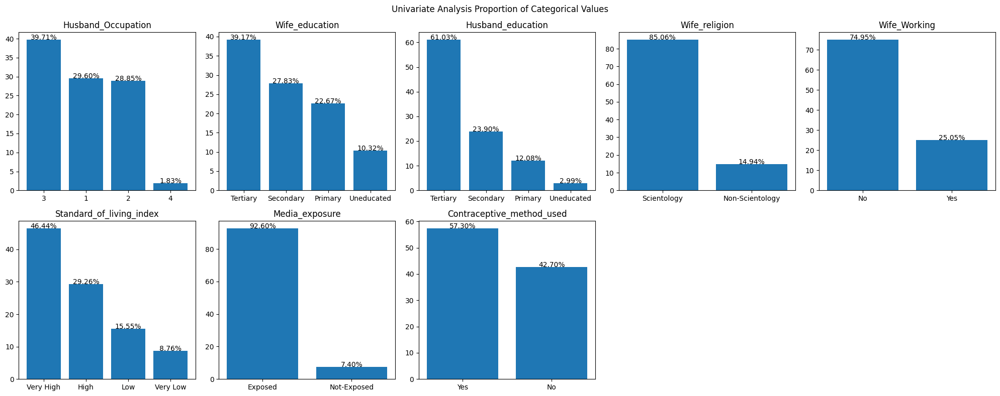

In [91]:
contra_data_cat_cols = contra_data[cat_cols]

ncols = 5
nrows = np.ceil(len(contra_data_cat_cols.columns) / ncols).astype(int)
fig, axs = plt.subplots(nrows, ncols, figsize=(20, 4*nrows))
axs = axs.flatten()

for ax,col in zip(axs,contra_data_cat_cols.columns):
    summary = contra_data_cat_cols[col].value_counts(normalize=True)*100
    ax.bar(summary.index, summary.values)
    
    for i in range(len(summary)):
        ax.text(x=i, y=summary.iloc[i], s=f'{summary.iloc[i]:.2f}%', ha='center')
    ax.set_title(col)

for i in range(len(contra_data_cat_cols.columns), len(axs)):
    fig.delaxes(axs[i])

fig.suptitle('Univariate Analysis Proportion of Categorical Values')
plt.tight_layout()
plt.savefig('./images/propotion_plots.svg')
plt.show()

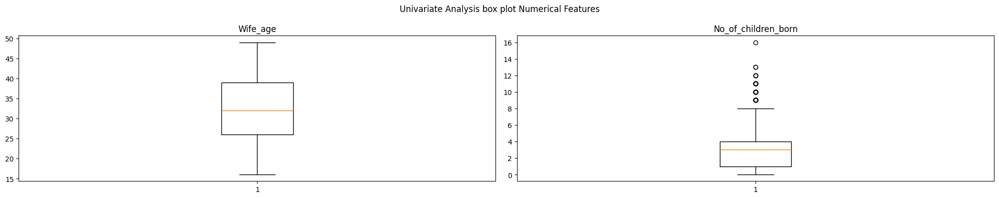

In [92]:
num_cols = [col for col in contra_data.columns if col not in cat_cols]
contra_data_num_cols = contra_data[num_cols]
ncols = 2
nrows = np.ceil(len(contra_data_num_cols.columns) / ncols).astype(int)
fig, axs = plt.subplots(nrows, ncols, figsize=(20, 4*nrows))
axs = axs.flatten()

for ax,col in zip(axs,contra_data_num_cols.columns):
    y = contra_data_num_cols[col]
    ax.boxplot(y.dropna().values)
    ax.set_title(col)

for i in range(len(contra_data_num_cols.columns), len(axs)):
    fig.delaxes(axs[i])

fig.suptitle('Univariate Analysis box plot Numerical Features')
plt.tight_layout()
plt.savefig('./images/contra_box_plots.svg')
plt.show()

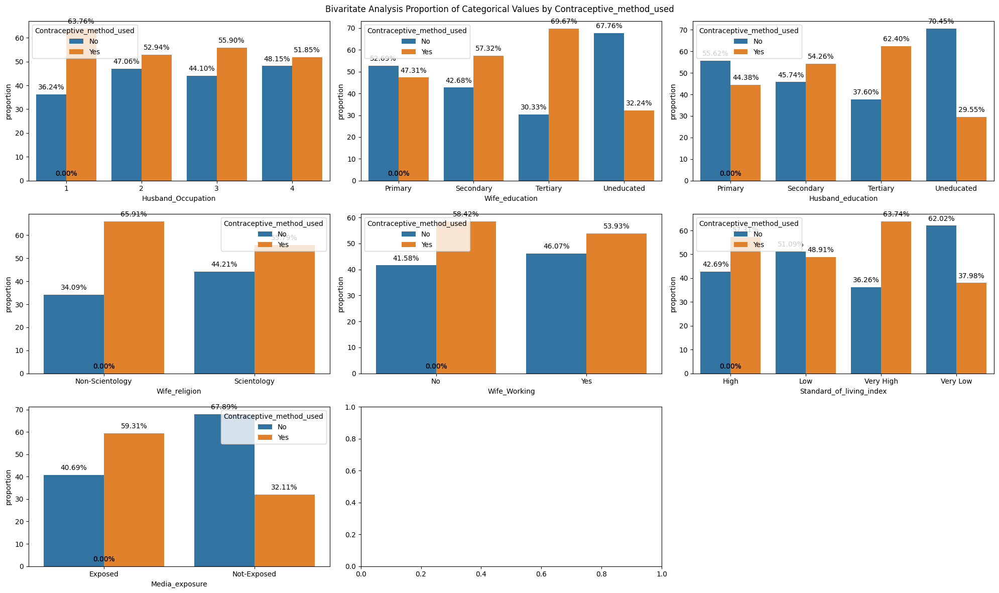

In [93]:
contra_data_cat_cols = contra_data[cat_cols]

hue_col = 'Contraceptive_method_used'

ncols = 3
nrows = np.ceil(len(contra_data_cat_cols.columns) / ncols).astype(int)
fig, axs = plt.subplots(nrows, ncols, figsize=(20, 4*nrows))
axs = axs.flatten()

for ax,col in zip(axs,contra_data_cat_cols.columns):
    if col != 'Contraceptive_method_used' :
        # Calculate the proportions
        summary = contra_data_cat_cols.groupby(col)[hue_col].value_counts(normalize=True).mul(100)
        summary = summary.rename('proportion').reset_index()   
        # Create the bar plot
        bar_plot = sns.barplot(x=col, y='proportion', data=summary, ax=ax, hue=hue_col)
         
        # Add the values to the bars
        for p in bar_plot.patches:
            bar_plot.annotate(format(p.get_height(), '.2f') + '%', 
                              (p.get_x() + p.get_width() / 2., p.get_height()), 
                              ha = 'center', va = 'center', 
                              xytext = (0, 10), 
                              textcoords = 'offset points')
        
    
for i in range(len(contra_data_cat_cols.columns), len(axs)):
    fig.delaxes(axs[i])

fig.suptitle('Bivaritate Analysis Proportion of Categorical Values by Contraceptive_method_used')
plt.tight_layout()
plt.savefig('./images/Hue_propotion_plots.svg')
plt.show()

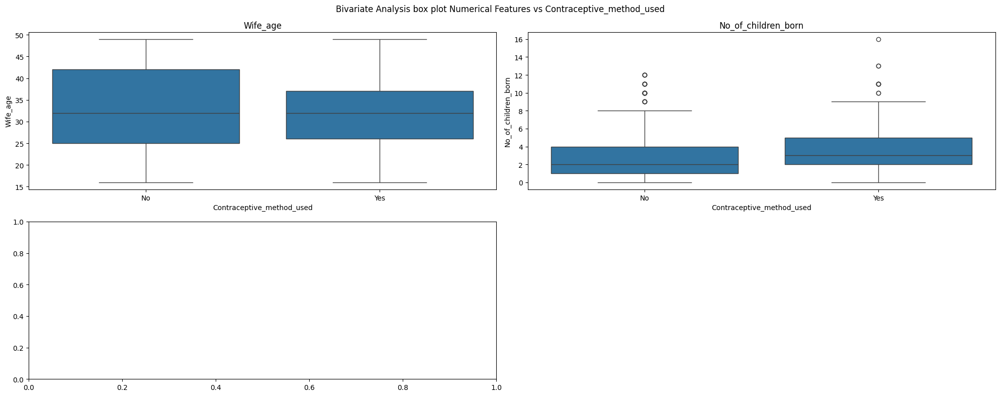

In [94]:
num_cols = [col for col in contra_data.columns if col not in cat_cols]
num_cols.append(hue_col)
contra_data_num_cols = contra_data[num_cols]

ncols = 2
nrows = np.ceil(len(contra_data_num_cols.columns) / ncols).astype(int)
fig, axs = plt.subplots(nrows, ncols, figsize=(20, 4*nrows))
axs = axs.flatten()

for ax,col in zip(axs,contra_data_num_cols.columns):
    if col != hue_col:
        sns.boxplot(x=hue_col, y=col, data=contra_data_num_cols, ax=ax)
        ax.set_title(col)

for i in range(len(contra_data_num_cols.columns), len(axs)):
    fig.delaxes(axs[i])

fig.suptitle('Bivariate Analysis box plot Numerical Features vs Contraceptive_method_used')
plt.tight_layout()
plt.savefig('./images/contra_hue_box_plots.svg')
plt.show()

## Question 2 : Data Pre-processing
### Prepare the data for modelling :
###  Missing value Treatment (if needed) 
- Wife_age and No_of_children_born are treated for missing values with imputation of median value
### Outlier Detection(treat, if needed)
- There are outliers in No_of_children_born but we will not treat these as these are real repersentations
### Feature Engineering (if needed) 
- We will not engineer any features
- we would scale the columns Wife_age and number of children.
### Encode the data
- Encode Wife_education and Husband_education with values 0,1,2,3 for Uneducated, Primary, Secondary and Tertiary respectively.
- Encode Wife_religon with values 0,1 for Non-Scientology and Scientology respectively.
- Encode Wife_working with values 0,1 for No and Yes respectively.
- Encode Standar_of_living_index with values 0,1,2,3,4 for Very Low, Low, High and Very High respectively
- Encode Media_exposure with values 0,1 for Not-Exposed and Exposed respectively
#### Train-Test Split:
- We do a split of the data 70-30 Train-Test.
- Apply scaling (described in Feature Engineering) to the Train and Test post the Split.

In [95]:
contra_data_copy = contra_data.copy()

In [96]:
contra_data_copy.isna().sum()

Wife_age                     71
Wife_education                0
Husband_education             0
No_of_children_born          21
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64

In [97]:
num_cols= ['Wife_age', 'No_of_children_born']

In [98]:
for col in num_cols:
    contra_data_copy[col] = contra_data_copy[col].fillna(contra_data_copy[col].median())

In [99]:
contra_data_copy.isna().sum()

Wife_age                     0
Wife_education               0
Husband_education            0
No_of_children_born          0
Wife_religion                0
Wife_Working                 0
Husband_Occupation           0
Standard_of_living_index     0
Media_exposure               0
Contraceptive_method_used    0
dtype: int64

In [100]:
contra_data_copy.describe(include='all').round().T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Wife_age,1473.0,NaN,NaN,NaN,33.0,8.0,16.0,26.0,32.0,38.0,49.0
Wife_education,1473,4,Tertiary,577,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Husband_education,1473,4,Tertiary,899,NaN,NaN,NaN,NaN,NaN,NaN,NaN
No_of_children_born,1473.0,NaN,NaN,NaN,3.0,2.0,0.0,1.0,3.0,4.0,16.0
Wife_religion,1473,2,Scientology,1253,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Wife_Working,1473,2,No,1104,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Husband_Occupation,1473,4,3,585,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Standard_of_living_index,1473,4,Very High,684,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Media_exposure,1473,2,Exposed,1364,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Contraceptive_method_used,1473,2,Yes,844,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [101]:
#Encoding the categorical columns
contra_data_copy.Husband_Occupation = contra_data_copy.Husband_Occupation.astype(int).astype('category')

In [102]:
# create encoding dictionaries
education_dict = {'Uneducated': 0,'Primary':1,'Secondary':2,'Tertiary':3}
religon_dict = {'Non-Scientology': 0,'Scientology':1}
working_dict = {'No': 0,'Yes':1}
soli_dict = {'Very Low': 0,'Low':1,'High':2,'Very High':3}
media_dict = {'Not-Exposed': 0,'Exposed':1}
contraceptive_dict = {'No': 0,'Yes':1}

contra_data_copy.Wife_education = contra_data_copy.Wife_education.replace(education_dict)
contra_data_copy.Husband_education = contra_data_copy.Husband_education.replace(education_dict)
contra_data_copy.Wife_religion = contra_data_copy.Wife_religion.replace(religon_dict)
contra_data_copy.Wife_Working = contra_data_copy.Wife_Working.replace(working_dict)
contra_data_copy.Standard_of_living_index = contra_data_copy.Standard_of_living_index.replace(soli_dict)
contra_data_copy.Media_exposure = contra_data_copy.Media_exposure.replace(media_dict)
contra_data_copy.Contraceptive_method_used = contra_data_copy.Contraceptive_method_used.replace(contraceptive_dict)

In [103]:
X = contra_data_copy.drop('Contraceptive_method_used', axis=1)
y = contra_data_copy['Contraceptive_method_used']

X_train, X_test, y_train, y_test =  train_test_split(X, y, test_size = 0.3, random_state = 42)

In [104]:
X_train_scale = X_train[['Wife_age','No_of_children_born']]
X_test_scale = X_test[['Wife_age','No_of_children_born']]
X_train_scale.head()

,Wife_age,No_of_children_born
135,26.0,3.0
1099,23.0,4.0
477,21.0,1.0
974,31.0,3.0
435,45.0,7.0


In [105]:
scaler = StandardScaler()
# fit and transform train data
X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train_scale), columns=X_train_scale.columns,index=X_train_scale.index)
# transform test data
X_test_scaled = pd.DataFrame(scaler.transform(X_test_scale), columns=X_test_scale.columns,index=X_test_scale.index)


In [106]:
X_train.drop(columns=['Wife_age','No_of_children_born'],inplace=True)
X_train = pd.concat([X_train,X_train_scaled],axis=1)

In [107]:
X_test.drop(columns=['Wife_age','No_of_children_born'],inplace=True)
X_test = pd.concat([X_test,X_test_scaled],axis=1)

In [108]:
X_test

,Wife_education,Husband_education,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Wife_age,No_of_children_born
852,2,2,1,0,3,3,1,-0.479519,0.278864
184,2,3,1,1,2,1,1,0.258001,0.695542
1261,3,3,0,0,1,3,1,-1.217040,-0.971173
67,1,2,1,0,3,0,1,-0.356599,-0.137815
220,1,2,1,0,3,2,1,-1.339960,-0.971173
...,...,...,...,...,...,...,...,...,...
331,0,1,1,1,4,3,1,0.258001,-1.387851
323,0,2,1,1,3,3,0,-1.462880,-1.387851
855,2,3,1,0,3,2,1,-0.848280,-0.137815
1112,2,3,1,0,3,2,1,-1.831640,-0.971173


## Question 3 : Model Building and Compare the Performance of the Models :
### Build a Logistic Regression model - Build a Linear Discriminant Analysis model - Build a CART model 
- We build Logistic Regression, LDA and a DecisionTree Classifier.
- The results to compare is here:
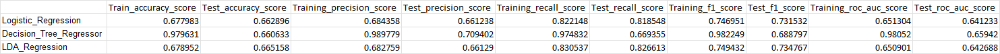
- f1 score which is the harmonic mean of the Recall and Precision is the highest for the "Logistic Regression", it also has decent recall but precision is a concern.
- Precision score is good for the DecisionTree Classifier, depending on the use case we can got with either.
### Prune the CART model by finding the best hyperparameters using GridSearch:
- optimum parameter for the CART Model is : {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 30, 'min_samples_split': 15}
- we see that with this the CART Model is a good contender as the f1 score is the highest and the recall and precision scores is the highest
- Runing the model with those parameter this is how the performance changes:
- 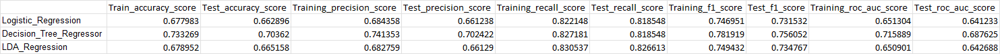
### Compare the performance of all the models built and choose the best one with proper rationale
- we see that with this the CART Model is a best as on the test data:
    - f1 score is the highest
    - the recall and precision scores is the highest
    - the roc_auc_score is the highest


In [109]:
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

In [110]:
dtr = DecisionTreeClassifier(random_state=42)
regression_model = LogisticRegression()
lda = LinearDiscriminantAnalysis()


models=[regression_model,dtr,lda]

accuracy_score_train=[]
accuracy_score_test=[]
precision_score_train=[]
precision_score_test=[]
recall_score_train=[]
recall_score_test=[]
f1_score_train=[]
f1_score_test=[]
roc_auc_score_train=[]
roc_auc_score_test=[]

for i in models:  # Computation of RMSE and R2 values
    i.fit(X_train,y_train)
    y_train_pred  = i.predict(X_train)
    y_test_pred = i.predict(X_test)
    
    accuracy_score_train.append(accuracy_score(y_train, y_train_pred))
    accuracy_score_test.append(accuracy_score(y_test, y_test_pred))
    precision_score_train.append(precision_score(y_train, y_train_pred))
    precision_score_test.append(precision_score(y_test, y_test_pred))
    recall_score_train.append(recall_score(y_train, y_train_pred))
    recall_score_test.append(recall_score(y_test, y_test_pred))
    f1_score_train.append(f1_score(y_train, y_train_pred))
    f1_score_test.append(f1_score(y_test, y_test_pred))
    roc_auc_score_train.append(roc_auc_score(y_train, y_train_pred))
    roc_auc_score_test.append(roc_auc_score(y_test, y_test_pred))

print(pd.DataFrame({'Train_accuracy_score': accuracy_score_train,'Test_accuracy_score': accuracy_score_test,'Training_precision_score':precision_score_train,'Test_precision_score': precision_score_test, 'Training_recall_score':recall_score_train,'Test_recall_score': recall_score_test , 'Training_f1_score':f1_score_train,'Test_f1_score': f1_score_test, 'Training_roc_auc_score':roc_auc_score_train,'Test_roc_auc_score': roc_auc_score_test},
            index=['Logistic_Regression','Decision_Tree_Classifier', 'LDA_Regression']))

                          Train_accuracy_score  Test_accuracy_score  \
Logistic_Regression                   0.677983             0.662896   
Decision_Tree_Classifier              0.979631             0.660633   
LDA_Regression                        0.678952             0.665158   

                          Training_precision_score  Test_precision_score  \
Logistic_Regression                       0.684358              0.661238   
Decision_Tree_Classifier                  0.989779              0.709402   
LDA_Regression                            0.682759              0.661290   

                          Training_recall_score  Test_recall_score  \
Logistic_Regression                    0.822148           0.818548   
Decision_Tree_Classifier               0.974832           0.669355   
LDA_Regression                         0.830537           0.826613   

                          Training_f1_score  Test_f1_score  \
Logistic_Regression                0.746951       0.731532   
Decis

In [111]:
# using Grid search to Prune the DTC
param_grid = {
    'max_depth': [10,15,20,25,30],
    'min_samples_leaf': [3, 15,30],
    'min_samples_split': [15,30,35,40,50],
    'criterion' :['gini', 'entropy']
}

dtr=DecisionTreeClassifier()

grid_search = GridSearchCV(estimator = dtr, param_grid = param_grid, cv = 3)


grid_search.fit(X_train,y_train)

print(grid_search.best_params_)

{'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 30, 'min_samples_split': 15}


In [112]:
dtr = DecisionTreeClassifier(criterion = 'entropy', max_depth = 10, min_samples_leaf= 30, min_samples_split= 15,random_state=42)
regression_model = LogisticRegression()
lda = LinearDiscriminantAnalysis()


models=[regression_model,dtr,lda]

accuracy_score_train=[]
accuracy_score_test=[]
precision_score_train=[]
precision_score_test=[]
recall_score_train=[]
recall_score_test=[]
f1_score_train=[]
f1_score_test=[]
roc_auc_score_train=[]
roc_auc_score_test=[]

for i in models:  # Computation of RMSE and R2 values
    i.fit(X_train,y_train)
    y_train_pred  = i.predict(X_train)
    y_test_pred = i.predict(X_test)
    
    accuracy_score_train.append(accuracy_score(y_train, y_train_pred))
    accuracy_score_test.append(accuracy_score(y_test, y_test_pred))
    precision_score_train.append(precision_score(y_train, y_train_pred))
    precision_score_test.append(precision_score(y_test, y_test_pred))
    recall_score_train.append(recall_score(y_train, y_train_pred))
    recall_score_test.append(recall_score(y_test, y_test_pred))
    f1_score_train.append(f1_score(y_train, y_train_pred))
    f1_score_test.append(f1_score(y_test, y_test_pred))
    roc_auc_score_train.append(roc_auc_score(y_train, y_train_pred))
    roc_auc_score_test.append(roc_auc_score(y_test, y_test_pred))

print(pd.DataFrame({'Train_accuracy_score': accuracy_score_train,'Test_accuracy_score': accuracy_score_test,'Training_precision_score':precision_score_train,'Test_precision_score': precision_score_test, 'Training_recall_score':recall_score_train,'Test_recall_score': recall_score_test , 'Training_f1_score':f1_score_train,'Test_f1_score': f1_score_test, 'Training_roc_auc_score':roc_auc_score_train,'Test_roc_auc_score': roc_auc_score_test},
            index=['Logistic_Regression','Decision_Tree_Classifier', 'LDA_Regression']))

                          Train_accuracy_score  Test_accuracy_score  \
Logistic_Regression                   0.677983             0.662896   
Decision_Tree_Classifier              0.733269             0.703620   
LDA_Regression                        0.678952             0.665158   

                          Training_precision_score  Test_precision_score  \
Logistic_Regression                       0.684358              0.661238   
Decision_Tree_Classifier                  0.741353              0.702422   
LDA_Regression                            0.682759              0.661290   

                          Training_recall_score  Test_recall_score  \
Logistic_Regression                    0.822148           0.818548   
Decision_Tree_Classifier               0.827181           0.818548   
LDA_Regression                         0.830537           0.826613   

                          Training_f1_score  Test_f1_score  \
Logistic_Regression                0.746951       0.731532   
Decis

## Question 4 : Business Insights & Recommendations

- if we run the "Logistic Regression" in its current state it is not very usefull, in order to strengthing the model, we would like to perform tools Like PCA for futher feature engineering to try and get a more robust "Logistic Regression"
- We also need to check if we could get more data as the number of observations seems to be less it would be good to get more surveys done to get more info.
- we could also explore further with one hot encoding techniques to see if any goodness is got with that models trained on that data.
- we could explore tools and techniques like random forest, Support Vector, Kmeans clustering too to see if this helps identify patterns in the data.
- In the current state we do have the option of going with the "Decision Tree Classifier" which though may not have a linear relationship with the independant and dependant variables, still seems to a very good fit given the current training and test.
This model however may need to be trained move frequently on live data and tested in real case senarios to make sure of its viability